<h1 style='color:orange; font-weight:bold; text-align:center'>Investigating Key Themes in GoPay User Feedback: A Topic Modeling Approach</h1>

Dataset: [here](https://www.kaggle.com/datasets/imamsatrio/app-store-gojek-reviews)

## **1 Introduction**
- Background
- Introducing GoPay as a popular digital payment in Indonesia. This e-payment is used for transactions for different sectors, including online shopping.
- Discuss the significance of user feedback in understanding customer satisfaction and product performance
- Explain reviews can provide insights into user experiences, preferences, and painpoints which are crucial for improving services and enhancing customer satisfaction
- Mention the difficulty in manually analyzing qualitative data from user reviews, leading to missed opportunities for improvement. 
- Approach: This project will utilize topic modeling, a natural language processing technique to identify themes in large volumes of texts. It can help reveal hidden insights and trend in user feedback, potentially revealing user sentiments
- Questions
    - What are the predominant themes discussed in user reviews of the GoPay app? To reveal usability, features
    - Are there any common complaints or issues user encounter while using GoPay?
    - How does user sentiment vary across different topics related to the app?
    - How do user sentiments change over time?

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Note:</strong> Topic and theme refer to different ideas in academic writing. Topic denotes a specific subject matter whereas theme refers to the underlying idea from the topic. On the other hand, they are usually used interchangeably in topic modeling to mean underlying patterns or clusters of words representing different ideas in a corpus.
</div>

In [1]:
import re
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import skew, kurtosis
import matplotlib.dates as mdates
from nltk import bigrams
from collections import Counter
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures
from nltk.corpus import stopwords
import nltk
from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from mpl_toolkits.mplot3d import Axes3D
import warnings

plt.style.use('ggplot')
pd.options.display.max_colwidth=50
warnings.filterwarnings("ignore", category=DeprecationWarning)

## **2 General Overview**
Before performing an analysis, a general overview about the dataset should be obtained to understand the characteristics of the dataset, and address potential problems in the dataset. This section will inspect the cleanliness of the dataset by investigating the number of observations, number of features, data types, duplicates, missing values, and descriptive statistics.

In [2]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [3]:
# create function to inspect df
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NAPct': (df.isna().mean() * 100).round(2).tolist(),
        'DuplicatePct': (df.duplicated().sum()/len(df)*100).round(2),
        'UniqueValue': df.nunique().tolist(),
        'Sample': [df[col].unique() for col in df.columns]
    }
    return pd.DataFrame(summary)

In [4]:
# inspect dataframe
print(f'The dataframe contains {df4.shape[0]} rows and {df4.shape[1]} cols.')
print(f"- {len(df4.select_dtypes(include='number').columns)} are numeric cols")
print(f"- {len(df4.select_dtypes(include='O').columns)} are object cols")
inspect_dataframe(df4)

The dataframe contains 123253 rows and 6 cols.
- 2 are numeric cols
- 4 are object cols


,ColumnName,Nrow,DataType,NAPct,DuplicatePct,UniqueValue,Sample
0,userName,123253,object,0.00,0.0,1747,"[Pengguna Google, bang Kozu, fadilah saputra, ..."
1,content,123253,object,0.00,0.0,78431,"[Mantap, Bagus dan mudah digunakan, Good, Sang..."
2,score,123253,int64,0.00,0.0,5,"[5, 4, 1, 2, 3]"
3,thumbsUpCount,123253,int64,0.00,0.0,252,"[0, 1, 3, 11369, 2, 51, 10, 46, 204, 24, 19, 7..."
4,reviewCreatedVersion,123253,object,12.92,0.0,40,"[1.24.1, 1.23.0, nan, 1.26.1, 1.17.0, 1.15.1, ..."
5,at,123253,object,0.00,0.0,122902,"[2024-07-07 16:58:06, 2024-07-07 16:57:08, 202..."


**Note**
- The dataset consists of 6 variables in which 2 of them are numerical and 4 are categorical. Among these variables, `at` is misidentified as an object or categorical variable when it should have been a datetime. A conversion will be necessary to explore the trend of topics over time. This discussion can shed light on whether negative perceptions or specific problems with transactions persist over time.
- The dataset contains a big size of rows which potentially pose a challenge during searching the ideal number of topics using grid search. The size of dataset will also lead to high computational resource for t-distributed Stochastic Neighbor Embedding (henceforth, t-SNE) as this data reduction technique for visualizing local patterns (topic clusters) require intensive computational resource. For this reason, an implementation Principal Component Analysis (PCA) may be necessary to reduce the high-dimensional data prior to passing the data to t-SNE for visualizing the topic clusters.
- Variable `reviewCreatedVersion`, representing the app version, contains a high rate of missing values. A further exploration is needed to determine whether data imputation techniques are necessary to address the missing values.
- Duplicates are not present in the dataset. As shown on the dataframe above, all variables contain 0% of duplicates. For this reason, I will not perform further checking on duplicates.

In [5]:
# convert at to datetime
df4['at'] = pd.to_datetime(df4['at']).dt.date

In [6]:
# get descriptive statistics
df4.select_dtypes(include='number').describe().round().transpose()

,count,mean,std,min,25%,50%,75%,max
score,123253.0,4.0,1.0,1.0,5.0,5.0,5.0,5.0
thumbsUpCount,123253.0,1.0,48.0,0.0,0.0,0.0,0.0,11369.0


**Note**
- In general, both numerical features do not seem to have normal distributions as shown by the central tendencies. Variable `score` has value range between 1 and 5, and the majority of rating scores are 5. With min 1, the percentile 25% until max value is 5, indicating the rating scores are clustered at the end of the distribution. Overall, this tendency might indicate majority of GoPay users are satisfied with the services they received on the app. 
- Values of variable `thumsUpCount`, unlike the rating scores, are centered around the lower end of the distribution. This means that while some reviews received a lot of thumbs up, most of them only got a few or even zeros.
- To check further whether the different tendencies really occur, data visualization techniques such as a boxplot or a histogram can be used to confirm. 

In [7]:
df_numeric = df4.select_dtypes(include='number')
stats_df = pd.DataFrame({
    'column': df_numeric.columns,
    'skew': df_numeric.apply(lambda col: col.skew()).values,
    'kurtosis': df_numeric.apply(lambda col: col.kurtosis()).values
}).round(4)

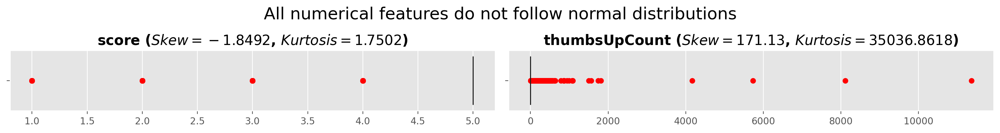

In [8]:
# visualize distributions
plt.figure(figsize=(15, 7), dpi=200)

for i, col in enumerate(df_numeric.columns):
    plt.subplot(5, 2, i+1)
    sns.boxplot(x=df_numeric[col], color='darkgreen',
                flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, markersize=10))
    skew_value = stats_df.loc[stats_df['column'] == col, 'skew'].values[0]
    kurtosis_value = stats_df.loc[stats_df['column'] == col, 'kurtosis'].values[0]
    plt.title(f"{col} ($Skew = {skew_value}$, $Kurtosis = {kurtosis_value}$)", 
              size=15, fontweight='bold')
    plt.xlabel(None)
plt.suptitle('All numerical features do not follow normal distributions', size=18)
plt.tight_layout()
plt.show()

**Note**
- In line with the insights discovered in the previous descriptive statistics, the boxplots indicate different tendencies in variable `score` and `thumbsUpCount`. While values in `score` tend to pile up at the end of the higher end of the distribution (negatively skewed), those in `thumbsUpCount` are clustered at the lower end of the distribution (positively skewed).
- This insight, therefore, confirm the previous result that not only they have different tendencies but also do not follow normal distribution for the skewness.

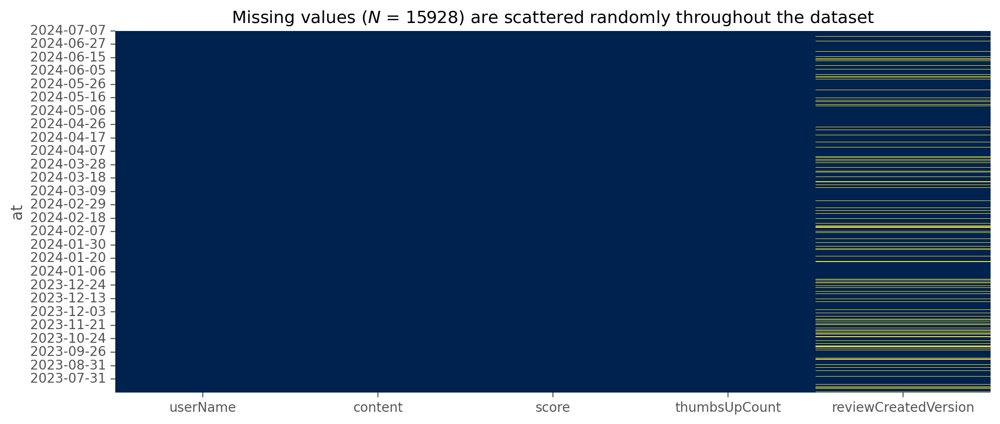

In [9]:
# check columns with missing values
plt.figure(figsize=(12, 5), dpi=200)
n_isna = df4['reviewCreatedVersion'].isna().sum()
sns.heatmap(df4.set_index('at').isna(), cmap=mpl.colormaps['cividis'], cbar=False)
plt.title(f'Missing values ($N$ = {n_isna}) are scattered randomly throughout the dataset', fontsize=13)
plt.show()

**Note**: The number of missing values constitute 15,928 instances (12.92%) in `reviewCreatedVersion`. Due to the high number, discarding the instances cannot be an option because the removal can decrease a significant number of data. To address the missing values, I will perform data imputation with a constant categorical value, namely `Undefined`. The ultimate goal of this project is to understand the key themes in the reviews (`content`), making the app version not critical in this project.

In [10]:
# perform imputation
df4['reviewCreatedVersion'].fillna('Undefined', inplace=True)

# double check missing valuees
df4.isna().mean()*100

/var/folders/lt/w7rn9x3n1dl812m_1qp6j_j00000gp/T/ipykernel_8275/38582060.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df4['reviewCreatedVersion'].fillna('Undefined', inplace=True)


userName                0.0
content                 0.0
score                   0.0
thumbsUpCount           0.0
reviewCreatedVersion    0.0
at                      0.0
dtype: float64

## **3 Exploratory Data Analysis**
The exploratory data analysis (EDA) will consists of several sub-analyses to focus the exploration based on categories such as user engagement, temporal analysis, and content analysis.

### **3.1 User Engagement**
#### **3.1.1 How many users give each score?**
Overall, do GoPay app users satisfied with the app?

In [11]:
score_df = df4['score'].value_counts().reset_index().round(2)
total_count = score_df['count'].sum()

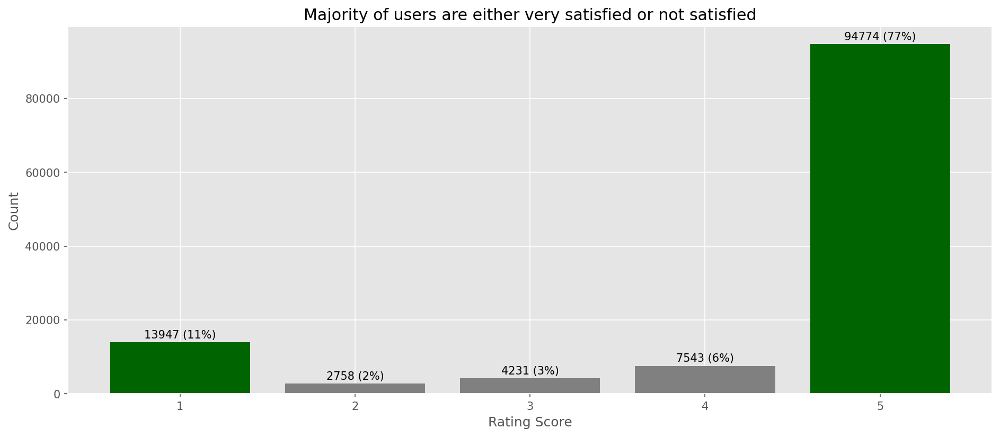

In [12]:
# create a color list for the bars
colors = ['darkgreen' if score in [1, 5] else 'grey' for score in score_df['score']]

# create the bar plot
plt.figure(figsize=(15, 6), dpi=150)
ax = plt.bar(score_df['score'], score_df['count'],
             color=colors)

for bar in ax:
    yval = bar.get_height()
    percentage = (yval / total_count) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 500,
             f'{yval} ({percentage:.0f}%)',
             ha='center', va='bottom')

plt.xlabel('Rating Score')
plt.ylabel('Count')
plt.title('Majority of users are either very satisfied or not satisfied')
plt.xticks(score_df['score'])
plt.show()

#### **3.1.2 Are there any patterns in the reviewers?**

In [13]:
# Get the top users for score 1 and score 5
rating_score1 = (df4[df4['score'] == 1]['userName']
                 .value_counts(normalize=True)
                 .reset_index()
                 .round(4)
                 .head(10))
rating_score1['userName'] = rating_score1['userName'].apply(lambda x: x.lower())
rating_score1.columns = ['userName', 'percent']

rating_score5 = (df4[df4['score'] == 5]['userName']
                 .value_counts(normalize=True)
                 .reset_index()
                 .round(4)
                 .head(10))
rating_score5['userName'] = rating_score5['userName'].apply(lambda x: x.lower())
rating_score5.columns = ['userName', 'percent']

# convert percentages 100
rating_score1['percent'] *= 100
rating_score5['percent'] *= 100

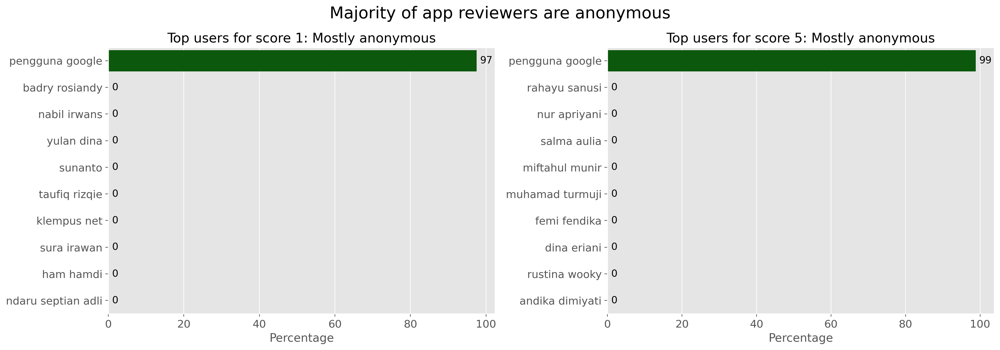

In [14]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(17, 6), dpi=200)

# Horizontal bar plot for score 1
sns.barplot(x='percent', y='userName', data=rating_score1,
            ax=axes[0], color='darkgreen')
axes[0].set_title('Top users for score 1: Mostly anonymous', fontsize=16)
axes[0].set_xlabel('Percentage', fontsize=14)
axes[0].set_ylabel(None)
for index, value in enumerate(rating_score1['percent']):
    axes[0].text(value + 1, index, f'{value:.0f}', va='center', fontsize=12)
axes[0].tick_params(axis='y', labelsize=13)
axes[0].tick_params(axis='x', labelsize=13)

# Horizontal bar plot for score 5
sns.barplot(x='percent', y='userName', data=rating_score5,
            ax=axes[1], color='darkgreen')
axes[1].set_title('Top users for score 5: Mostly anonymous', fontsize=16)
axes[1].set_xlabel('Percentage', fontsize=14)
axes[1].set_ylabel(None)
for index, value in enumerate(rating_score5['percent']):
    axes[1].text(value + 1, index, f'{value:.0f}', va='center', fontsize=12)
axes[1].tick_params(axis='y', labelsize=13)
axes[1].tick_params(axis='x', labelsize=13)

plt.suptitle('Majority of app reviewers are anonymous', size=20)
plt.tight_layout()
plt.show()

#### **3.1.2 Which reviews have the most thumbs up?**

In [15]:
(df4.nlargest(n=5, columns='thumbsUpCount')
 .iloc[:, 0:4]
 .style.background_gradient(subset=['thumbsUpCount'], cmap='YlOrRd'))

,userName,content,score,thumbsUpCount
539,Pengguna Google,"WOI banget aplikasi ini, semua fungsi e banking bisa dilakukan di sini. Transfer ke semua rekening bank lancar real time dan gratis. Selain transfer bisa juga bayar rekening listrik, telepon, internet, PDAM, top up e wallet dll. Bukti bayar atau transfer dgn mudah dishare ke WA dll. Setelah sempat hilangkan nama tujuan transfer, skrg sdh muncul lagi. Saatnya kembali gunakan Gopay..",5,11369
84341,Pengguna Google,"Semua fiturnya gampang buat digunakan, tampilan UI nya buat pemula kayak saya cukup oke sih, gampang di pahami. Kemarin nyobain top up masuknya cepet, oh iya ada banyak promo juga buat pengguna baru, sejauh ini belum nemu bug sih",5,8109
47854,Pengguna Google,"Sudah cukup baik, permudah pengguna dalam lakukan transaksi keuangan khususnya, baik top up maupun transaksi pembayaran2, tingkatkan terus , cuma sayangnya saya yg tdk pernah telat apalagi nunggak bayaran paylater & selalu bayar penuh, tetap saja susah dapatin fasilitas Gopay Pinjam apalagi limit paylater yg besar. Mohon perhatiannya, sukses selalu",5,5736
113082,Pengguna Google,"Aplikasinya bagus banget dan ngebantu banget, kalau mau beli pulsa atau paket data jadi lebih gampang, bisa bayar listrik juga, mau transfer uang juga mudah dan ga ada biaya transfernya juga, mantap pokoknya.fitur didalamnya juga simpel tapi tetep modern,.. Pokoknya rekomended banget deh gopay ini☺️",5,4169
105623,Pengguna Google,"Aplikasinya bener"" memudahkan banget transfer tanpa ribet, buat beli pulsa dan daya juga tinggal klik"" , trus mau transfer pun gada biaya admin. bayar listrik juga bisa ih suka banget. fitur"" nya juga gampang dipahami rekomended banget deh pokoknya.",5,1810


<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

In [32]:
thumbsup_df = df4.groupby('score', as_index=False).agg({'thumbsUpCount': 'sum'})

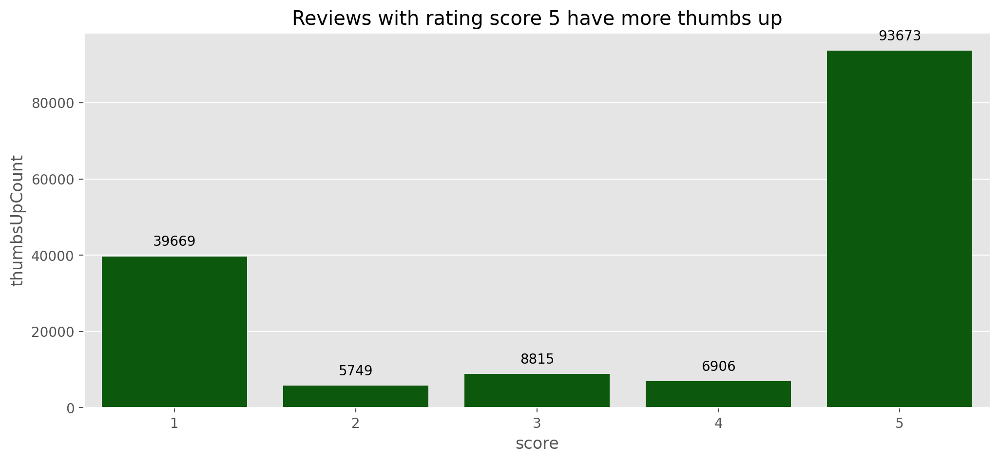

In [31]:
plt.figure(figsize=(12, 5), dpi=200)
sns.barplot(y='thumbsUpCount', x='score', data=thumbsup_df, legend=False, color='darkgreen')
# Add data labels on top of the bars
for index, value in enumerate(thumbsup_df['thumbsUpCount']):
    plt.text(index, value + 2000, str(value), ha='center', va='bottom', fontsize=10)
plt.title('Reviews with rating score 5 have more thumbs up')
plt.show()

### **3.2 Temporal Analysis**
- How does the distribution of scores change over time?
- Is there a trend in scores over the different versions of the app?
- Are there any seasonal patterns in user reviews?
- Do certain times of year correlate with higher or lower scores?

#### **3.2.1 Are there any temporal patterns in user rating scores?**

In [16]:
# prepare dataset
df4['at'] = pd.to_datetime(df4['at'])
daily_scores = df4.groupby(df4['at'].dt.date)['score'].mean().reset_index()

# Calculate IQR for the scores
Q1 = daily_scores['score'].quantile(0.25)
Q3 = daily_scores['score'].quantile(0.75)
IQR = Q3 - Q1
lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

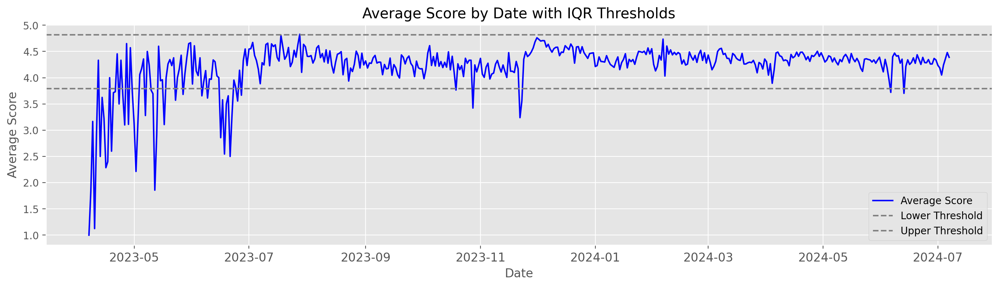

In [17]:
# Plotting
plt.figure(figsize=(17, 4), dpi=200)
plt.plot(daily_scores['at'], daily_scores['score'],
         linestyle='-', color='b', label='Average Score')
plt.axhline(lower_threshold, color='grey', linestyle='--', label='Lower Threshold')
plt.axhline(upper_threshold, color='grey', linestyle='--', label='Upper Threshold')
plt.title('Average Score by Date with IQR Thresholds')
plt.xlabel('Date')
plt.ylabel('Average Score')
plt.xticks(rotation=0, fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

In [60]:
# Group by month and calculate the average score
monthly_scores = df4.resample('ME', on='at')['score'].mean().reset_index()
monthly_scores['at'] = monthly_scores['at'].dt.strftime('%Y-%m')
monthly_scores['at'] = pd.to_datetime(monthly_scores['at'])

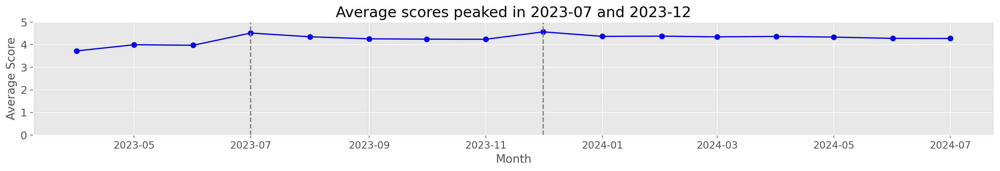

In [61]:
# Plotting
plt.figure(figsize=(17, 3), dpi=200)
plt.plot(monthly_scores['at'], monthly_scores['score'], marker='o', linestyle='-', color='b')
plt.axvline(pd.to_datetime('2023-07-01'), color='grey', linestyle='--', label='Peak in 2023-07')
plt.axvline(pd.to_datetime('2023-12-01'), color='grey', linestyle='--', label='Peak in 2023-12')
plt.title('Average scores peaked in 2023-07 and 2023-12', size=18)
plt.xlabel('Month', size=14)
plt.ylabel('Average Score', size=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(np.arange(0, 6, 1), rotation=0, fontsize=13)
plt.grid(True)
plt.tight_layout()
plt.show()

Is there a trend in scores over the different versions of the app?
too many versions to display

In [20]:
df4['month'] = df4['at'].dt.month
df4['year'] = df4['at'].dt.year
pivot_df = df4.pivot_table(values='score', index='year', columns='month', aggfunc='mean')

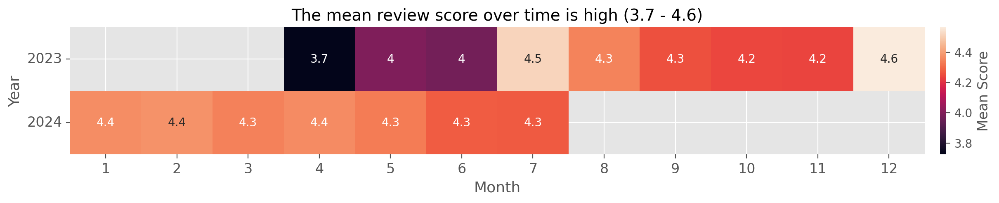

In [21]:
plt.figure(figsize=(16, 2), dpi=200)
sns.heatmap(pivot_df, annot=True, cbar_kws={'label':'Mean Score', 'pad': 0.015})
plt.title('The mean review score over time is high (3.7 - 4.6)', size=14)
plt.ylabel('Year', size=13)
plt.xlabel('Month', size=13)
plt.yticks(rotation=0, fontsize=12)
plt.xticks(rotation=0, fontsize=12)
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> Starting from Jul 2023, the general trend of user rating scores is plateauing high with peaks in Jul 2023 (mean: 4.5) and Dec 2024 (mean: 46).
</div>

### **3.3 Version Analysis**
- How does user satisfaction vary across different app versions?
- Which version has the highest or lowest average score?

#### **3.3.1 Which app version received low and high rating scores?**

In [22]:
scoreby_version = (pd.crosstab(df4['reviewCreatedVersion'], df4['score'],
                               margins=True, margins_name='Total')
                               .iloc[:-1, :])

(scoreby_version.nlargest(n=10, columns='Total')
 .style.background_gradient(cmap='YlOrRd'))

score,1,2,3,4,5,Total
reviewCreatedVersion,,,,,,
Undefined,3164,519,708,910,10627,15928
1.14.0,1246,243,344,773,11100,13706
1.19.0,1104,227,408,762,8486,10987
1.15.1,889,184,303,593,8098,10067
1.21.0,1042,211,270,609,7893,10025
1.13.0,403,104,145,366,6803,7821
1.18.1,607,152,260,446,4865,6330
1.16.1,506,110,206,337,4291,5450
1.20.2,415,85,136,292,3544,4472


<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> App version 1.14.0 is the top-rated app. And in general, all versions remain having high rates.
</div>

### **3.4 Content Analysis**
Areas: Text lengths, frequent words, n-grams, and word cloud.
- Text length to check length variability which may affect the model's ability to extract topics. Plot histograms of thee document length.
- N-grams: Explore bigrams or trigrams conveying meaningful context. Plot most frequent n-grams to understand common patterns.

- The language detection with `langdetect` is not accurate enough. Many instances were detected as Tagalog instead of Indonesian. At glance, these inaccuracies are led by the short length so language detector performs poorly. Other possiblilty is the fact that the reviewers used informal variant of Indonesian which has not been sufficiently codified and trained on the language model. Given these inaccuracies, I will not use the feature. Column `language` will be removed from the dataset.

#### **3.4.1 Are the review contents generally long or short?**

In [23]:
# extract review length
df4['review_len'] = df4['content'].str.split().str.len()

In [24]:
Q1 = df4['review_len'].quantile(0.25)
Q3 = df4['review_len'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df4.loc[(df4['review_len'] < lower_bound) | (df4['review_len'] > upper_bound)]
num_outliers = len(outliers)
total_rows = len(df4)

print(f"The number of outliers is {num_outliers} or {(num_outliers/total_rows*100):.2f}% of the total data ({total_rows} rows).")
display(outliers.sort_values(by='review_len', ascending=False).head())

The number of outliers is 9943 or 8.07% of the total data (123253 rows).


,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,month,year,review_len
75430,Pengguna Google,Stock Cheek Pad Dll Eps Sid Bluetooth: 1000 Ep...,2,0,Undefined,2024-01-25,1,2024,105
6495,Pengguna Google,"Gopay sejauh ini bgs, bs d blng luar biasa , c...",4,0,1.23.0,2024-06-22,6,2024,102
42344,Pengguna Google,"Gw gak tau duit gw bisa balik apa nggak , gw t...",1,1,1.19.0,2024-04-04,4,2024,96
3179,Pengguna Google,3 hari lalu sy top up saldo ovo via apk GoPay....,1,0,Undefined,2024-06-30,6,2024,93
55160,Pengguna Google,Mantap aplikasi anak bangsa .... Berharap gopa...,5,40,1.17.1,2024-03-09,3,2024,93


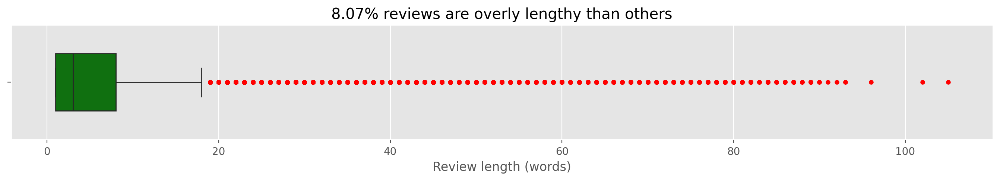

In [25]:
plt.figure(figsize=(17, 2), dpi=200)
sns.boxplot(x=df4['review_len'], color='green', width=0.5,
            flierprops=dict(marker='.', markerfacecolor='red',
                            markeredgecolor='red', alpha=1,
                            markersize=7))

plt.title(f'{(num_outliers/total_rows*100):.2f}% reviews are overly lengthy than others')
plt.xlabel('Review length (words)')
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

#### **3.4.3 What are the most common words in the app reviews?**
Most common words are searched to identify what common or irrelevant words dominating the models, e.g., stop words

In [26]:
# prepare stopwords
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))
custom_stopwords = {'yang', 'aja', 'yg', 'nya', 'sih', 'oh', 'e', 'deh'}
stop_words.update(custom_stopwords)

# preprocess function
def preprocess_text(text):
    if isinstance(text, str):                                           # check if the input is a string
        text = text.lower()                                             # convert to lowercase
        text = re.sub(r'\d+', '__num__', text)                          # remove numbers
        text = re.sub(r'\W+', ' ', text)                                # remove punctuation
        text = re.sub(r'http\S+|www\S+', '__url__', text)               # remove URLs
        tokens = text.split()                                           # split into tokens
        tokens = [word for word in tokens if word not in stop_words]    # remove stopwords
        return tokens
    return []                                                           # if not string, return an empty list

# apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

**Note**
- The set of stopwords in Indonesian is defined to filter out common words which lack or have no semantic content. A custom set of stopwords is also added since some discourse particles and enclitics are absent.

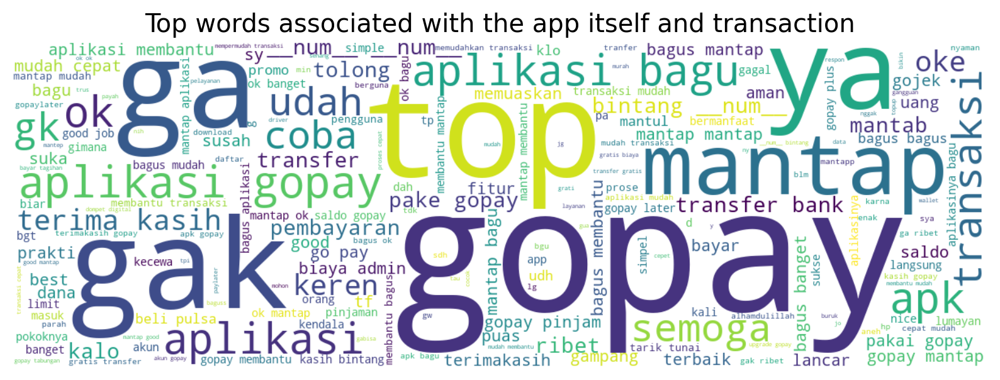

In [27]:
# Flatten the list of tokens into a single string
all_tokens = ' '.join([' '.join([word for word in tokens if word not in stop_words]) for tokens in df4['tokens']])

# Create the word cloud object
wordcloud = WordCloud(width=1200, height=400, background_color='white').generate(all_tokens)

# Plot the word cloud
plt.figure(figsize=(10, 5), dpi=200)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Top words associated with the app itself and transaction')
plt.axis('off')  # Turn off axis
plt.show()

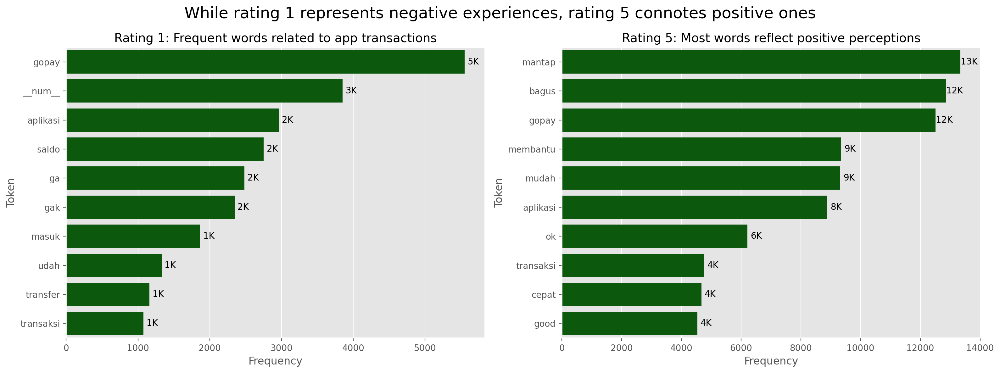

In [43]:
# create subplots: two columns side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6), dpi=200)

# plot 1: Most frequent tokens for score 1 (on the left)
all_tokens = [token for sublist in df4[df4['score'] == 1]['tokens'] for token in sublist]
token_counts = Counter(all_tokens)
token_df = (pd.DataFrame(token_counts.items(), columns=['token', 'count'])
            .sort_values(by='count', ascending=False))

sns.barplot(x='count', y='token', data=token_df.head(10), color='darkgreen', ax=axes[0])
axes[0].set_title('Rating 1: Frequent words related to app transactions', fontsize=14)
axes[0].set_xlabel('Frequency', fontsize=12)
axes[0].set_ylabel('Token', fontsize=12)
for p in axes[0].patches:
    count_value = int(p.get_width())
    label = f'{count_value // 1000}K' if count_value >= 1000 else str(count_value)
    axes[0].annotate(label,
                     (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', xytext=(10, 0),
                     textcoords='offset points', fontsize=10)

# Plot 2: Most frequent tokens for score 5 (on the right)
all_tokens = [token for sublist in df4[df4['score'] == 5]['tokens'] for token in sublist]
token_counts = Counter(all_tokens)
token_df = (pd.DataFrame(token_counts.items(), columns=['token', 'count'])
            .sort_values(by='count', ascending=False))

sns.barplot(x='count', y='token', data=token_df.head(10), color='darkgreen', ax=axes[1])
axes[1].set_title('Rating 5: Most words reflect positive perceptions', fontsize=14)
axes[1].set_xlabel('Frequency', fontsize=12)
axes[1].set_ylabel('Token', fontsize=12)
for p in axes[1].patches:
    count_value = int(p.get_width())
    label = f'{count_value // 1000}K' if count_value >= 1000 else str(count_value)
    axes[1].annotate(label,
                     (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', xytext=(10, 0),
                     textcoords='offset points', fontsize=10)

plt.suptitle('While rating 1 represents negative experiences, rating 5 connotes positive ones', 
             size=18)
plt.tight_layout()
plt.show()

- Signifies rooms for improvement, locating the user painpoints
- Signifies the strengths of the app

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

#### **3.4.4 What are the most frequent phrases in the reviews?**
Due to the high volume of text data, getting most frequent phrases in the app reviews using bigram and trigram cannot be done. The large data size is unable to process using my local machine. For this reason, I will focus more on user reviews containing "gopay" with one and five rating stars by subsetting the dataset.

In [29]:
# subset rating score 1 and 5
score1 = df4[(df4['score'] == 1) & (df4['content'].str.contains('gopay'))]
score5 = df4[(df4['score'] == 5) & (df4['content'].str.contains('gopay'))]

##### **3.4.4.1 Most Frequent Phrases in Score Rating 1**

In [47]:
# initialize CountVectorizer for n-grams
bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), token_pattern=r'\b\w+\b')
trigram_vectorizer = CountVectorizer(ngram_range=(3, 3), token_pattern=r'\b\w+\b')
bigram_X = bigram_vectorizer.fit_transform(score1['content'])
trigram_X = trigram_vectorizer.fit_transform(score1['content'])

# get n-gram counts
bigram_counts = bigram_X.toarray().sum(axis=0)
trigram_counts = trigram_X.toarray().sum(axis=0)
bigram_names = bigram_vectorizer.get_feature_names_out()
trigram_names = trigram_vectorizer.get_feature_names_out()

# dfs for n-grams and their counts
bigram_df = pd.DataFrame({'ngram': bigram_names, 'count': bigram_counts})
bigram_df = bigram_df[bigram_df['count'] > 0].sort_values(by='count', ascending=False)
trigram_df = pd.DataFrame({'ngram': trigram_names, 'count': trigram_counts})
trigram_df = trigram_df[trigram_df['count'] > 0].sort_values(by='count', ascending=False)

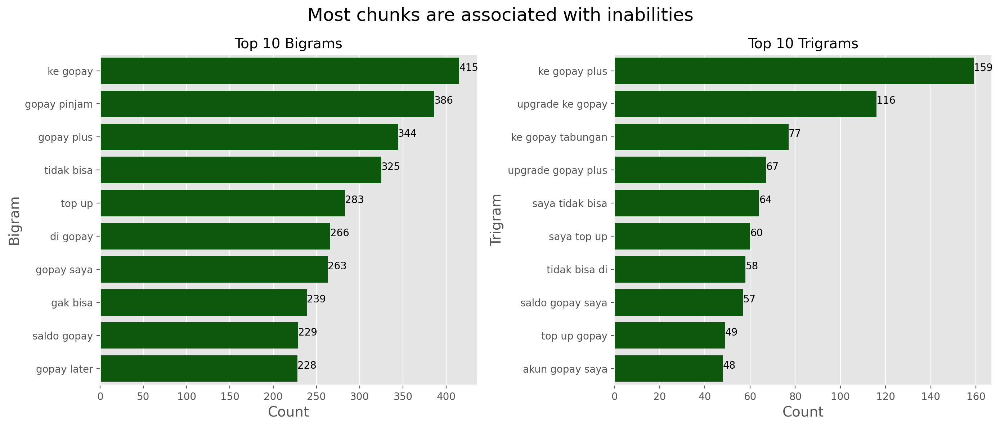

In [49]:
# create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=200)

# plot for bigrams
sns.barplot(x='count', y='ngram', data=bigram_df.head(10),
            ax=axes[0], color='darkgreen')
for index, value in enumerate(bigram_df.head(10)['count']):
    axes[0].text(value, index, str(value))
axes[0].set_title('Top 10 Bigrams', fontsize=14)
axes[0].set_xlabel('Count', fontsize=14)
axes[0].set_ylabel('Bigram', fontsize=14)

# plot for trigrams
sns.barplot(x='count', y='ngram', data=trigram_df.head(10),
            ax=axes[1], color='darkgreen')
for index, value in enumerate(trigram_df.head(10)['count']):
    axes[1].text(value, index, str(value))
axes[1].set_title('Top 10 Trigrams', fontsize=14)
axes[1].set_xlabel('Count', fontsize=14)
axes[1].set_ylabel('Trigram', fontsize=14)
plt.suptitle('Most chunks are associated with inabilities',
             size=18)
plt.tight_layout()
plt.show()

In [50]:
# filter dataset: score 1 only and containing gopay plus
inability_df = df4[(df4['score'] == 1) & (df4['content'].str.contains('tidak bisa'))]

# display result
print(f'Total instances: {len(inability_df)}')
pd.options.display.max_colwidth = 200
inability_df.sample(n=5, random_state=42).iloc[:, 0:2]

Total instances: 659


,userName,content
120002,Pengguna Google,Mengapa saya di Bali tidak bisa daftar ?☹️
80026,Pengguna Google,Saya mau tranfer ke rekening laen tidak bisa dengan alasan terlalu sering mencoba . padahal masih satu kali mau tranfer. Aplikasi bagaimana ini. Kok sperti ini. Jangan d download hanya merugikan. ...
20381,Pengguna Google,"Untuk transfer dari Gopay ke Bank Mandiri diatas jam 22, selalu tidak bisa dilakukan/transaksi gagal."
58358,Pengguna Google,"Tapi sayang, Gopay Paylleternya sering tidak bisa dipakai, pembayaran lancar tapi dipersulit. Dan sekarang malah diblokir."
12301,Pengguna Google,Percuma ada fitur gopay pinjam tapi tidak bisa di nikmati oleh drivernya.... Mending hapus aja tuh fitur gopay pinjam di apk driver..


In [32]:
# Preprocess function to clean text
def preprocess_text(text):
    if isinstance(text, str):                                           # Check if the input is a string
        text = text.lower()                                             # Convert to lowercase
        text = re.sub(r'http\S+|www\S+|https\S+', '', text)             # Remove URLs
        text = re.sub(r'\d+', ' ', text)                                # Remove numbers
        text = re.sub(r'\W+', ' ', text)                                # Remove punctuation
        text = re.sub(r'\s+', ' ', text)                                # Replace multiple spaces with a single space
        return text.strip()                                             # Return cleaned text
    return ''

# clean the content column
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [33]:
# create list store texts
all_text = ' '.join(df4['cleaned_content'].tolist())

# tokenize into words
tokens = all_text.split()

# find co-occurrences with "gopay plus"
co_occurrences = []
for i in range(len(tokens) - 1):
    if tokens[i] == "tidak" and i < len(tokens) - 1 and tokens[i + 1] == "bisa":
        # look at words before and after gopay plus
        if i + 2 < len(tokens) and tokens[i + 2] not in stop_words:  # Word after, not a stopword
            co_occurrences.append(tokens[i + 2])  

# count the frequency 
co_occurrence_counts = Counter(co_occurrences)

In [34]:
# Display the results
co_occurrence_df = pd.DataFrame(co_occurrence_counts.items(), columns=['Word', 'Frequency'])
co_occurrence_df = co_occurrence_df.sort_values(by='Frequency', ascending=False)

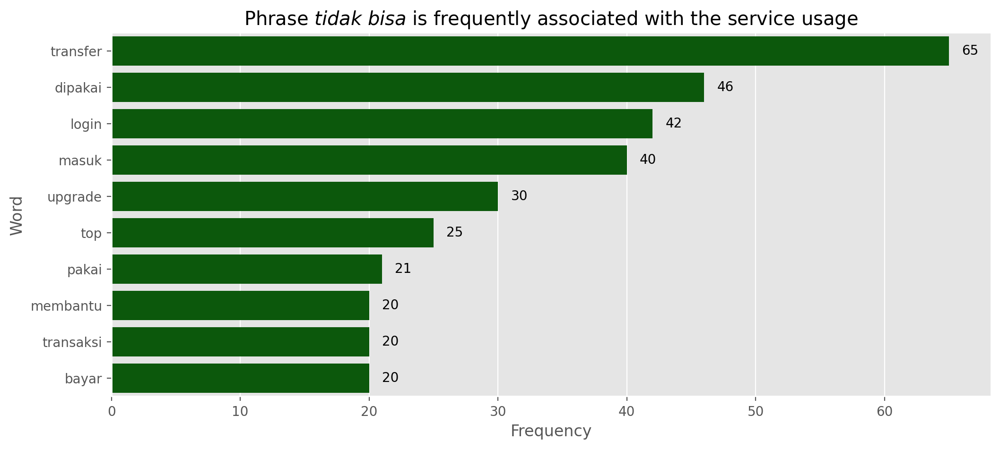

In [63]:
plt.figure(figsize=(12, 5), dpi=200)
sns.barplot(x='Frequency', y='Word', data=co_occurrence_df.head(10), legend=False, color='darkgreen')
for index, value in enumerate(co_occurrence_df['Frequency'].head(10)):
    plt.text(value + 1, index, str(value), va='center')

plt.xlabel('Frequency')
plt.ylabel('Word')
plt.title('Phrase $tidak$ $bisa$ is frequently associated with the service usage')
plt.show()

In [62]:
# should we care?
(inability_df.sort_values(by='thumbsUpCount', ascending=False)
 .loc[:, ['thumbsUpCount', 'cleaned_content']]
 .head(10)
 .style.background_gradient(subset=['thumbsUpCount'], cmap='YlOrRd'))

,thumbsUpCount,cleaned_content
71335,178,mau bayar dan beli tagihan gopay tidak bisa digunakan tanpa alasan yang jelas sudah laporin dan sudah di tanggapi tapi masalah tetap ak terselesaikan sampai sekarang akun saya masih tidak bisa membayar tagihan ataupun membeli token atau pulsa sangat mengecewakan
55521,177,gopaylater makin lama makin gak jelas awal awal dikasih limit bisa dipakai lancar pembayaran pun lancar udah bulan tidak bisa dipakai dengan alasan masih ada tagihan akun tidak memenuhi kualitas kredit la sekarang ada pemberitahuan penaikan limit tapi masih tetap saja diblokir ngapain dikasih limit dan dikasih kenaikan tapi tidak bisa dipakai tutup aja min
36166,157,sangat kecewa pada aplikasi gopay akun sdh gopay plus tiba balik ke basic mau upgarde lagi tidak bisa dengan alasan data ektp tdk sesuai dgn dukcapil sdh email pernyataan dari dukcapil klo data sesuai tetep tdk bisa krn warna rambut di foto ektp dan foto selfie berbeda tolong dunk jgn terlalu dibikin ribet yg pentingkan orangnya sama di bank aja tdk seribet ini
6848,151,aplikasi sangat buruk percuma ngasih limit besar pernah pakai juga tidak pernah telat bayar tagihan udah mau bulan ini paylaternya tidak bisa digunakan dengan alasan analisis penyedia layanan gopaylater telp cs jawaban bertele tele percuma
30881,137,tolong jangan ada yg pake aplikasi ini lagi ya karna benar jelek ga guna saya komplain respon nya malah salahin bca karna katanya ada gangguan pas saya email bca nya ternyata ga ada gangguan sama sekali cs tidak memberikan solusi sama sekali sudah hari saya tidak bisa transaksi pake gopay gausa salahin sinyal ya saya udh pake kuota wifi pun tetap sama cs bego
29558,136,awal awal make sih bagus eeeh itu percuma juga setiap transaksi mendapatkan coins tapi faktanya coins tidak bisa untuk transaksi pembelian padahal katanya secara otomatis bisa untuk pembayaran setelah mengatifkan toggle omon omon doang gopay
29828,120,aplikasi pertam bagus dan banyak promo semakin kesini aplikasi yang tidak layak didownload banyak kesalahan mulai dari gopay later sampai promo tim yang menjawab seperti robot tidak bisa dicerna dan muter muter
28729,116,sudah sering kali setelah bayar tagihan gopay later langsung terblokir padahal tidak pernah telat bayar tagihan coba komplain tapi jawabannya selalu sama kredit analisis percuma di kasih limit besar tapi tidak bisa di pakai lebih baik di uninstal kalo sampai kejadian terblokir lagi dari pada cuma memenuhi memori hp tapi aplikasinya tidak bisa di pakai sangat mengecewakan
26778,80,sangat buruk saya coba ajuin pinjaman untuk pertama kali tapi langsung di tolak entah alasan apa dan saya coba hapus akun tapi tidak bisa alasannya krn terkendala masih ada pinjaman belum di lunasi aplikasi aneh padahal baru aja mau coba langsung ada pinjaman sory langsung kuhaous aplikasinya gak butuh yg kayak gini
14781,80,habis pembaharuan aplikasi gopay malah tiba tiba gopaylater diblokir tidak bisa dipergunakan transaksi padhaal baru beres bayar tagihan sebelm jatuh tempo ada apa nich tiba tiba diblokir wkwkw alasannya ternyata tdk memenuhi analisis kredit selama pakai aman aja baru pembaharuan aplikasi jawabannya tdk sesuai analisis kredit alhamdulillah hapus akun paylater nya


In [37]:
# get top-5 comments with the highest thums up count
(df4[df4['score'] == 1]
 .nlargest(n=10, columns='thumbsUpCount')
 .loc[:, ['userName', 'content', 'score', 'reviewCreatedVersion', 'thumbsUpCount']])

,userName,content,score,reviewCreatedVersion,thumbsUpCount
47782,Pengguna Google,"Aplikasi yg dengan gampangnya mudah ke lock untuk transaksi , pakai layanan bantuan TPI gak keluar keluar menu ... Sebelum banyak fitur perbaiki dulu fitur fitur yg dulu . Biar bisa maksimal ... H...",1,1.18.1,1748
100595,Pengguna Google,"Padahal udah cukup lama pakek gopay, eh pas ada kendala transaksi pembelian token PLN, pembayaran berhasil, saldo sudah berkurang, tapi token belum muncul juga. Komplain ke aplikasi bilang katanya...",1,1.12.1,1559
63870,Pengguna Google,"1. Aplikasi pengamannya minim. Pas buka aplikasi langsung ke menu beranda, seharusnya di pakein pin/sidik jari pas awal bka aplikasi. Kyak aplikasi² yg lain. 2. Semenjak gopay di gabungkan sma gop...",1,1.15.1,872
84181,Pengguna Google,"Saya kira aplikasinya sudah bagus, tapi fasilitas yang ditawarkan berbanding terbalik dengan pelayanannya/servicenya yang sangat buruk. Kebijakan blokir akun paylater tanpa pemberitahuan dan tanpa...",1,1.14.0,860
33134,Pengguna Google,"kenapa setiap kali mau tarik tunai prosesnya lama atau kode verifikasi tidak muncul, sering bgt kaya gini. kalo udah kaya gini otomatis nunggu 1 jam untuk saldo kembali lagi.. tolong eror soal pen...",1,1.19.0,857
69753,Pengguna Google,"Saya sudah cukup lama menggunakan gopaylater, dulu sangat mudah digunakan dan jarang sekali ada kendala selama penyedia layanan masih menggunakan findaya, tapi kenapa setelah diupdate dan berubah ...",1,1.15.1,617
82144,Pengguna Google,"Baru pertama ketemu aplikasi yg gak jelas, baru top up 500rb, baru ke pakai 100rb buat isi pulsa, stelah itu saldo hilang semua dan aplikasinya keluar sendiri, dan sampai saat ini saldo 400rb blum...",1,1.14.0,568
37736,Pengguna Google,"Pilihan pembayaran gopay later tiba2 hilang di tokopedia,padahal sebelumnya lancar2 saja,alasanya analisa kredit belum memenuhi,dengkulnya itu, limit banyak,kredit juga sudah berjalan,biasanya ya ...",1,1.19.0,534
50998,Pengguna Google,"""cek koneksi internet anda stabil atau nggak"",pastikan aplikasi ter update "" balasan dari developer .. gak ada penyelesaian masalah sama sekali internet saya super cepat, aplikasi juga udh terbaru...",1,1.18.1,530
42704,Pengguna Google,"Pembayaran gopay berhasil saldo terpotong. Tapi diaplikasi bima+ transaksi gagal. Komplain ke dua aplikasi tersebut, lama tidak ada tanggapan. Tinggal pilih pake atau tinggalkan aplikasi tersebut,...",1,1.20.0,514


##### **3.4.4.1 Most Frequent Phrases in Score Rating 5**

In [65]:
# initialize CountVectorizer for n-grams
bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), token_pattern=r'\b\w+\b')
trigram_vectorizer = CountVectorizer(ngram_range=(3, 3), token_pattern=r'\b\w+\b')
bigram_X = bigram_vectorizer.fit_transform(score5['content'])
trigram_X = trigram_vectorizer.fit_transform(score5['content'])

# get n-gram counts
bigram_counts = bigram_X.toarray().sum(axis=0)
trigram_counts = trigram_X.toarray().sum(axis=0)
bigram_names = bigram_vectorizer.get_feature_names_out()
trigram_names = trigram_vectorizer.get_feature_names_out()

# # dfs for n-grams and their counts
bigram_df = pd.DataFrame({'ngram': bigram_names, 'count': bigram_counts})
bigram_df = bigram_df[bigram_df['count'] > 0].sort_values(by='count', ascending=False)
trigram_df = pd.DataFrame({'ngram': trigram_names, 'count': trigram_counts})
trigram_df = trigram_df[trigram_df['count'] > 0].sort_values(by='count', ascending=False)

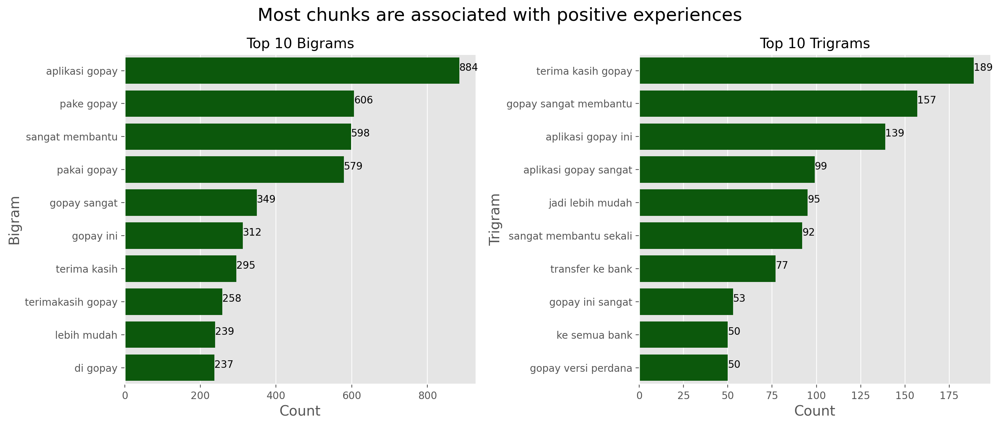

In [66]:
# create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=200)

# plot for bigrams
sns.barplot(x='count', y='ngram', data=bigram_df.head(10),
            ax=axes[0], color='darkgreen')
for index, value in enumerate(bigram_df.head(10)['count']):
    axes[0].text(value, index, str(value))
axes[0].set_title('Top 10 Bigrams', fontsize=14)
axes[0].set_xlabel('Count', fontsize=14)
axes[0].set_ylabel('Bigram', fontsize=14)

# plot for trigrams
sns.barplot(x='count', y='ngram', data=trigram_df.head(10),
            ax=axes[1], color='darkgreen')
for index, value in enumerate(trigram_df.head(10)['count']):
    axes[1].text(value, index, str(value))
axes[1].set_title('Top 10 Trigrams', fontsize=14)
axes[1].set_xlabel('Count', fontsize=14)
axes[1].set_ylabel('Trigram', fontsize=14)
plt.suptitle('Most chunks are associated with positive experiences',
             size=18)
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147; color:white">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

In [40]:
# Preprocess function to clean text
def preprocess_text(text):
    if isinstance(text, str):                                           # Check if the input is a string
        text = text.lower()                                             # Convert to lowercase
        text = re.sub(r'http\S+|www\S+|https\S+', '', text)             # Remove URLs
        text = re.sub(r'\d+', ' ', text)                                # Remove numbers
        text = re.sub(r'\W+', ' ', text)                                # Remove punctuation
        text = re.sub(r'\s+', ' ', text)                                # Replace multiple spaces with a single space
        return text.strip()                                             # Return cleaned text
    return ''

# clean the content column
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [72]:
# create list store texts
all_text = ' '.join(df4['cleaned_content'].tolist())

# tokenize into words
tokens = all_text.split()

# find co-occurrences with "gopay plus"
co_occurrences = []
for i in range(len(tokens) - 1):
    if tokens[i] == "aplikasi" and i < len(tokens) - 1 and tokens[i + 1] == "gopay":
        # look at words before and after gopay plus
        if i > 0 and tokens[i - 1] not in stop_words:                # Word before, not a stopword
            co_occurrences.append(tokens[i - 1])  
        if i + 2 < len(tokens) and tokens[i + 2] not in stop_words:  # Word after, not a stopword
            co_occurrences.append(tokens[i + 2])  

# count the frequency 
co_occurrence_counts = Counter(co_occurrences)

In [75]:
# Display the results
co_occurrence_df = pd.DataFrame(co_occurrence_counts.items(), columns=['Word', 'Frequency'])
co_occurrence_df = co_occurrence_df.sort_values(by='Frequency', ascending=False)

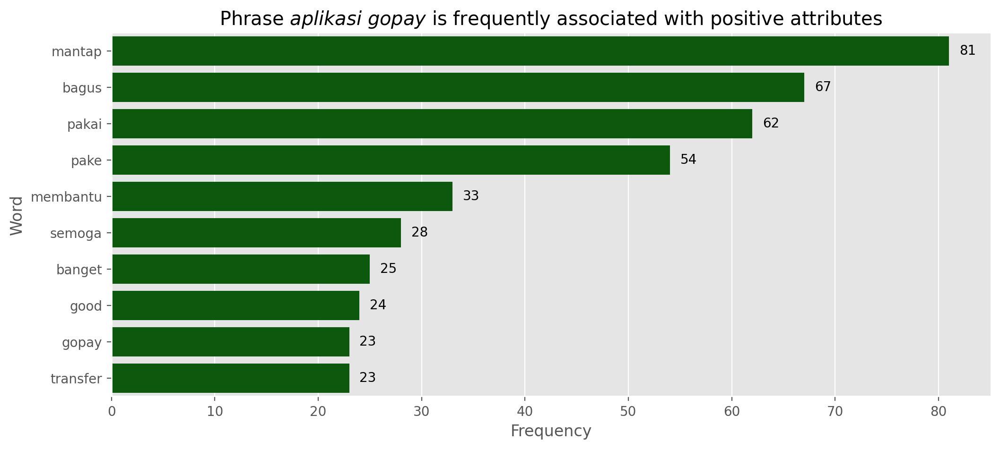

In [74]:
plt.figure(figsize=(12, 5), dpi=200)
sns.barplot(x='Frequency', y='Word', data=co_occurrence_df.head(10), legend=False, color='darkgreen')
for index, value in enumerate(co_occurrence_df['Frequency'].head(10)):
    plt.text(value + 1, index, str(value), va='center')

plt.xlabel('Frequency')
plt.ylabel('Word')
plt.title('Phrase $aplikasi$ $gopay$ is frequently associated with positive attributes')
plt.show()

## **4 Topic Modeling**

- Raw Word Frequencies:
    - Definition: This approach counts how often each word appears in a document or set of documents.
    - Output: Produces a list of words along with their counts or frequencies.
    - Limitations: Does not provide context or relationships between words. It can't capture themes or topics because it treats words in isolation.
- Topic Modeling:
    - Definition: A more advanced technique that identifies hidden themes or topics within a collection of texts by analyzing the co-occurrence of words.
    - Output: Generates a set of topics, each represented by a distribution of words that frequently occur together, along with the documents associated with each topic.
    - Advantages: Reveals the underlying structure of the text data, allowing for insights into the main themes, which helps in understanding context and relationships between concepts.

### **4.1 Latent Dirichlet Allocation (LDA)**
**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

#### **4.1.1 How LDA works**
**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

```python
# Pseudocode for LDA Topic Modeling
def LDA(D, K, alpha, beta, iterations):
    # Step 1: Initialize variables
    topics_per_doc = initialize_random(D, K)  # Randomly assign topics to each word
    words_per_topic = count_word_topic_assignments(D, K)
    topics_in_docs = count_topic_assignments_in_documents(D, K)
    
    for iter in range(iterations):
        for doc in D:
            for word in doc:
                current_topic = topics_per_doc[doc][word]

                # Step 2: Remove the current topic assignment
                topics_per_doc[doc][word] = None
                words_per_topic[current_topic][word] -= 1
                topics_in_docs[doc][current_topic] -= 1
                
                # Step 3: Compute the topic distribution probabilities
                topic_probs = []
                for topic in range(K):
                    p_topic_given_doc = (topics_in_docs[doc][topic] + alpha)/
                    (sum(topics_in_docs[doc]) + K * alpha)
                    p_word_given_topic = (words_per_topic[topic][word] + beta)/
                    (sum(words_per_topic[topic]) + len(vocab) * beta)
                    topic_probs.append(p_topic_given_doc * p_word_given_topic)
                
                # Step 4: Sample a new topic based on probabilities
                new_topic = sample_from_distribution(topic_probs)
                
                # Step 5: Update the counts with the new topic
                topics_per_doc[doc][word] = new_topic
                words_per_topic[new_topic][word] += 1
                topics_in_docs[doc][new_topic] += 1
    
    # Step 6: Return the topic distributions for documents and words
    document_topic_distribution = compute_document_topic_distribution(topics_in_docs, alpha)
    topic_word_distribution = compute_topic_word_distribution(words_per_topic, beta)
    
    return document_topic_distribution, topic_word_distribution
```

#### **4.1.2 Grid search of ideal topic number**

In [ ]:
df4[df4['tokens'] == []]

In [34]:
# create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

In [35]:
# search for optimal number of topics
topics_range = range(2, 11)
coherence_scores = []
timing_info = []

for num_topics in topics_range:
    start_time = time.time()
    # train the LDA model
    print(f'Training model with {num_topics} topics...')
    lda_model = LdaModel(corpus=corpus,
                         num_topics=num_topics,
                         id2word=dictionary,
                         passes=20,
                         random_state=42)
    # compute coherence score
    coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'],
                                    dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

    end_time = time.time()
    elapsed_time = end_time - start_time
    timing_info.append(elapsed_time)
    print(f'> Num of topics: {num_topics}, coherence score: {coherence_score:.4f}, training time: {elapsed_time:.2f} seconds')

Training model with 2 topics...
> Num of topics: 2, coherence score: 0.4995, training time: 88.96 seconds
Training model with 3 topics...
> Num of topics: 3, coherence score: 0.5186, training time: 102.41 seconds
Training model with 4 topics...
> Num of topics: 4, coherence score: 0.5309, training time: 97.65 seconds
Training model with 5 topics...
> Num of topics: 5, coherence score: 0.5503, training time: 97.65 seconds
Training model with 6 topics...
> Num of topics: 6, coherence score: 0.5342, training time: 97.63 seconds
Training model with 7 topics...
> Num of topics: 7, coherence score: 0.5215, training time: 103.33 seconds
Training model with 8 topics...
> Num of topics: 8, coherence score: 0.4851, training time: 95.98 seconds
Training model with 9 topics...
> Num of topics: 9, coherence score: 0.5026, training time: 95.64 seconds
Training model with 10 topics...
> Num of topics: 10, coherence score: 0.5016, training time: 94.46 seconds


In [36]:
mean_cs = np.mean(coherence_scores)
sd_cs = np.std(coherence_scores)
print(f'Mean of coherence scores: {mean_cs:.4f} ± {sd_cs:.4f}')

Mean of coherence scores: 0.5160 ± 0.0194


Mean of coherence scores: 0.5204 ± 0.0191

In [37]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

Optimal Number of Topics: 5


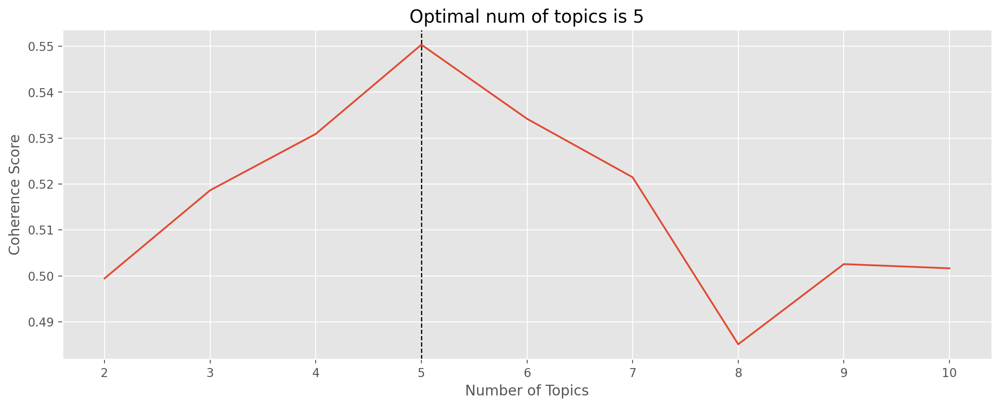

In [38]:
# Plot the coherence scores
plt.figure(figsize=(14, 5), dpi=200)
plt.plot(topics_range, coherence_scores)
plt.axvline(x=optimal_num_topics, linestyle='--', color='black', linewidth=1)
plt.xticks(range(2, 11, 1))
# plt.yticks(np.arange(0, 0.8, 0.2))
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title(f'Optimal num of topics is {optimal_num_topics}', size=15)
plt.show()

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

#### **4.1.3 Training LDA Model**

In [50]:
# Train LDA model with the optimal number of topics
start_time = time.time()
lda_model = LdaModel(corpus=corpus,
                     num_topics=optimal_num_topics,
                     id2word=dictionary,
                     random_state=42,
                     passes=20)
end_time = time.time()
print(f'Time taken for model training: {end_time - start_time:.2f} seconds')

Time taken for model training: 92.85 seconds


In [51]:
# compute coherence score
coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'],
                                 dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
# calculate perplexity
perplexity = lda_model.log_perplexity(corpus)

# Convert log perplexity to perplexity
perplexity_value = np.exp(-perplexity)

print(f'Coherence Score: {coherence_score:.4f}')
print(f'Perplexity: {perplexity_value:.4f}')

Coherence Score: 0.5503
Perplexity: 1345.6066


Coherence Score: 0.5287
Perplexity: 1368.9224

#### **Hyperparameter Tuning**

In [41]:
# from sklearn.model_selection import ParameterGrid

# param_grid = {
#     'alpha': ['auto', 0.01, 0.1, 1.0],
#     'beta': ['auto', 0.01, 0.1, 1.0],
#     # 'passes': [10, 15, 20],
#     'iterations': [100, 200]
# }

# grid = ParameterGrid(param_grid)

In [42]:
# best_coherence = -1
# best_params = {}

# for params in grid:
#     start_time = time.time()
#     # train the LDA model
#     tuned_lda_model = LdaModel(corpus=corpus,
#                          num_topics=optimal_num_topics,
#                          id2word=dictionary,
#                          alpha=params['alpha'],
#                         #  beta=params['beta'],
#                          passes=30,
#                          iterations=params['iterations'],
#                          random_state=42)
#     # calculate coherence score
#     coherence_model = CoherenceModel(model=tuned_lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
#     coherence_score = coherence_model.get_coherence()

#     end_time = time.time()
#     elapsed_time = end_time - start_time
#     print(f"Params: {params}, Coherence Score: {coherence_score:.4f}, Time Taken: {elapsed_time:.2f} seconds")

#     # update the best score and parameters
#     if coherence_score > best_coherence:
#         best_coherence = coherence_score
#         best_params = params

# print(f"Best Coherence Score: {best_coherence:.4f} with params: {best_params}")

In [52]:
# display the top 10 words for each topic
for idx, topic in lda_model.show_topics(num_topics=5, num_words=10, formatted=False):
    print(f"Topic {idx}:")
    print([word for word, _ in topic])
    print()

Topic 0:
['gopay', 'ga', 'pake', 'gak', 'bayar', 'aplikasi', 'gojek', 'ribet', 'oke', 'pakai']

Topic 1:
['membantu', 'aplikasi', 'gopay', 'semoga', 'keren', 'kasih', 'kota', 'bintang', '__num__', 'bermanfaat']

Topic 2:
['__num__', 'good', 'gopay', 'top', 'saldo', 'pulsa', 'beli', 'masuk', 'up', 'transfer']

Topic 3:
['mantap', 'ok', 'memudahkan', 'mempermudah', 'lengkap', 'go', 'bgt', 'versi', 'pay', 'jakarta']

Topic 4:
['bagus', 'mudah', 'banget', 'aplikasi', 'aplikasinya', 'transfer', 'transaksi', 'gopay', 'cepat', 'gratis']



In [53]:
pd.options.display.max_colwidth=None

# Extract the topics and their word distributions from the LDA model
topics_data = lda_model.show_topics(formatted=False)

# Prepare a list to store formatted topics
formatted_topics = []
for idx, topic in topics_data:
    formatted_topic = ', '.join([f"({word}, {weight:.2f})" for word, weight in topic])
    formatted_topics.append((idx, formatted_topic))

# Create a DataFrame
topics_df = pd.DataFrame(formatted_topics, columns=['n_topic', 'top_words'])
display(topics_df)

,n_topic,top_words
0,0,"(gopay, 0.07), (ga, 0.02), (pake, 0.02), (gak, 0.02), (bayar, 0.02), (aplikasi, 0.02), (gojek, 0.02), (ribet, 0.01), (oke, 0.01), (pakai, 0.01)"
1,1,"(membantu, 0.09), (aplikasi, 0.06), (gopay, 0.05), (semoga, 0.03), (keren, 0.03), (kasih, 0.03), (kota, 0.02), (bintang, 0.02), (__num__, 0.02), (bermanfaat, 0.02)"
2,2,"(__num__, 0.04), (good, 0.03), (gopay, 0.03), (top, 0.02), (saldo, 0.02), (pulsa, 0.02), (beli, 0.02), (masuk, 0.02), (up, 0.02), (transfer, 0.01)"
3,3,"(mantap, 0.23), (ok, 0.10), (memudahkan, 0.05), (mempermudah, 0.03), (lengkap, 0.03), (go, 0.02), (bgt, 0.02), (versi, 0.02), (pay, 0.01), (jakarta, 0.01)"
4,4,"(bagus, 0.11), (mudah, 0.08), (banget, 0.05), (aplikasi, 0.05), (aplikasinya, 0.04), (transfer, 0.03), (transaksi, 0.03), (gopay, 0.03), (cepat, 0.03), (gratis, 0.02)"


- Topic 0: This topic appears to focus on the use of GoPay as a payment application for transactions such as buying pulsa (top-up credits) and making payments in various kota (cities). It suggests discussions around using the app for daily purchases.
- Topic 1: This topic seems to address issues or opinions about the GoPay application, particularly the user experience with saldo (balance). The presence of "gak" (no/not) and "udah" (already) may imply negative sentiments or concerns about the app's functionality, possibly discussing insufficient balance or issues encountered.
- Topic 2: This topic reflects positive sentiments about the application. Words like "bagus" (good), "gratis" (free), and "memudahkan" (makes easier) indicate that users appreciate the app's features and functionality, particularly concerning transfers.
- Topic 3: This topic also highlights a positive experience with the app, emphasizing its ease of use (e.g., "mudah" - easy, "cepat" - fast, "aman" - safe). Users seem to find the app efficient for conducting transactions.
- Topic 4: This topic might focus on the overall satisfaction with the app and its features. Words like "mantap" (great) and "puas" (satisfied) indicate users find the app useful for managing their digital wallet or dompet (wallet).
- General:  the topics can be clustered around user experience, functionality, and sentiment regarding the GoPay application.

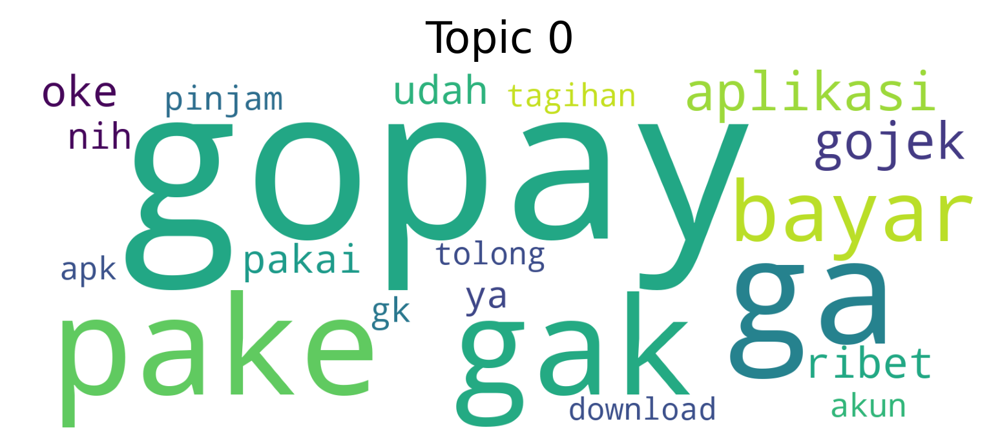

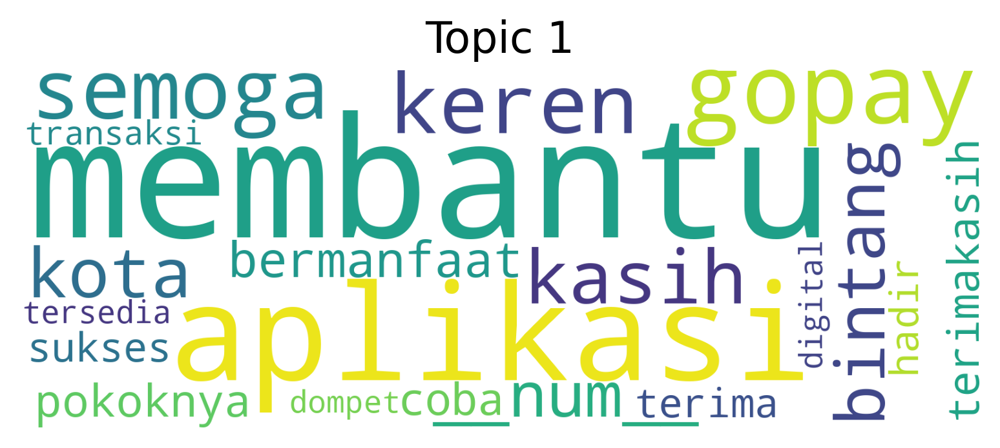

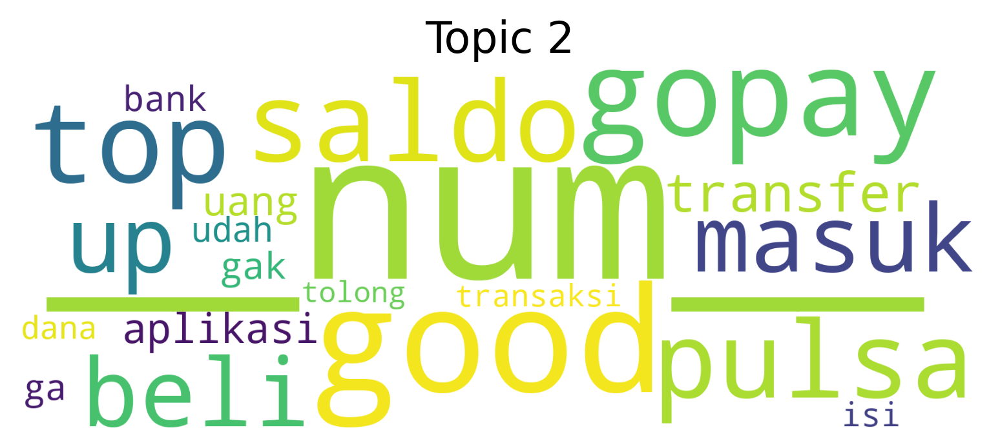

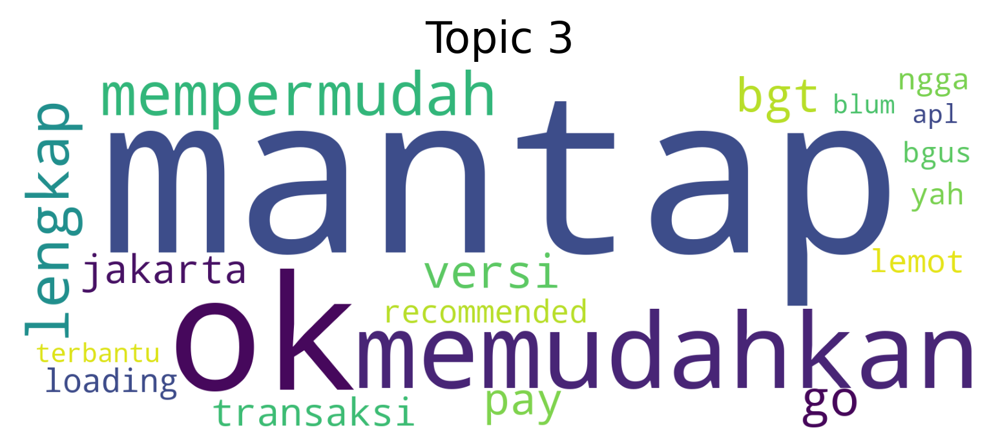

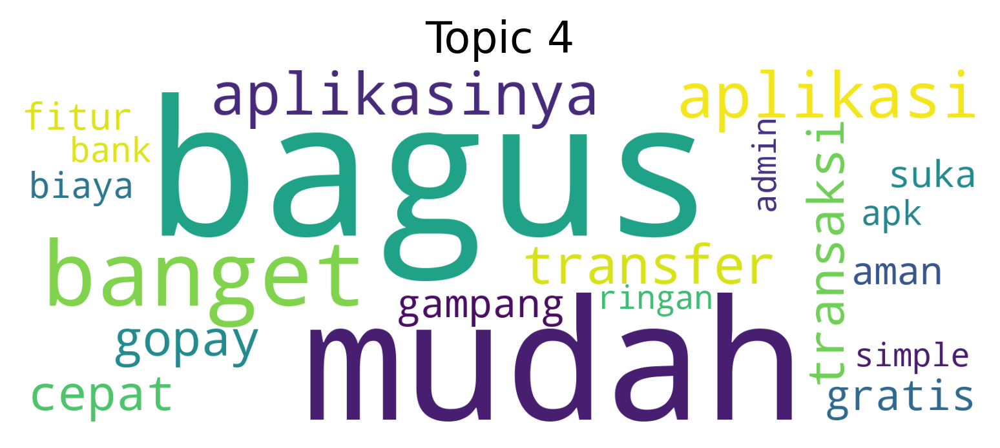

In [54]:
# Generate word clouds for each topic
for idx in range(lda_model.num_topics):
    plt.figure(dpi=300)  # Increased DPI
    wordcloud = WordCloud(width=1600, height=600, background_color='white')\
                .fit_words(dict(lda_model.show_topic(idx, topn=20)))

    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Topic {idx}', size=16)

    # Save the figure instead of showing it
    plt.show()

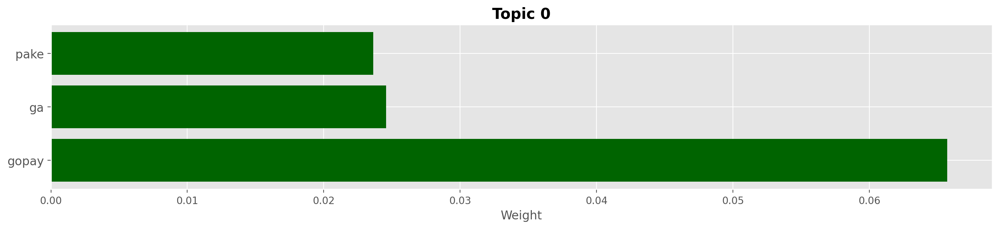

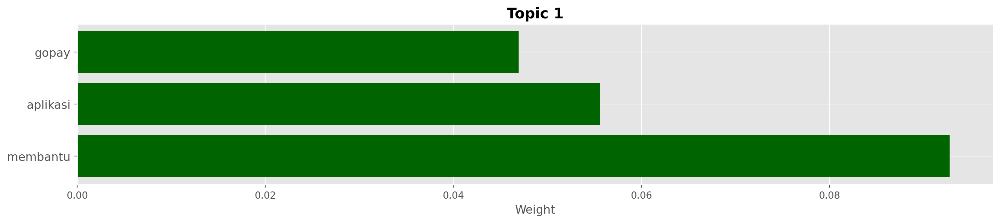

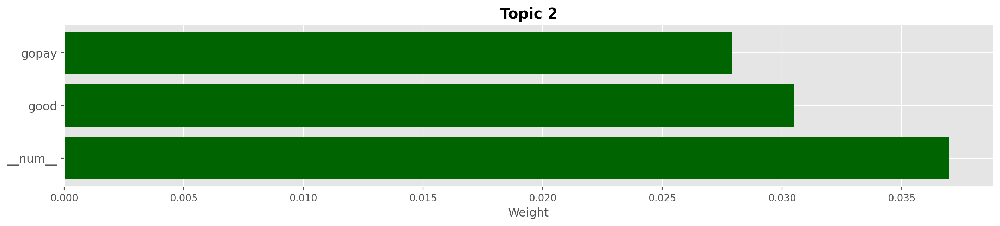

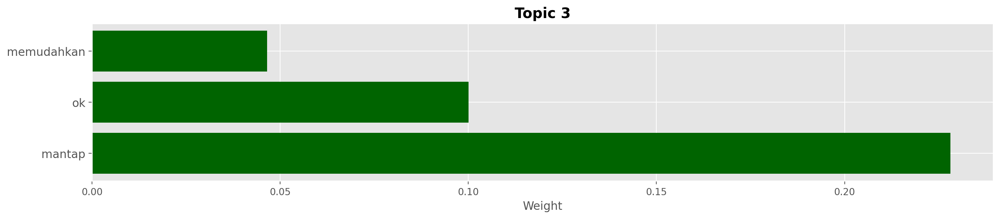

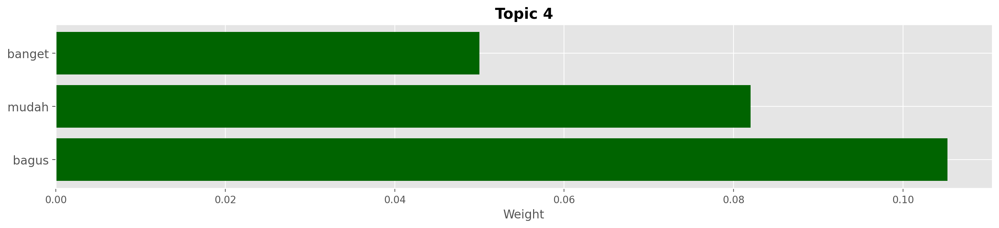

In [55]:
# Function to plot top words for each topic
def plot_top_words(model, num_words=3):
    for idx in range(model.num_topics):
        plt.figure(figsize=(17, 3), dpi=200)
        words = model.show_topic(idx, topn=num_words)
        words, weights = zip(*words)
        plt.barh(words, weights, color='darkgreen')
        plt.yticks(fontsize=12)
        plt.xlabel('Weight', size=12)
        plt.title(f'Topic {idx}', size=15, fontweight='bold')
        plt.show()

plot_top_words(lda_model)

In [57]:
# prepare data
topic_distribution = np.zeros((len(df4), lda_model.num_topics))
for i, item in enumerate(corpus):
    if item:
        topic_info = lda_model.get_document_topics(item)
        for topic_id, prob in topic_info:
            topic_distribution[i, topic_id] = prob

topic_df = pd.DataFrame(topic_distribution,
                        columns=[f'Topic {i}' for i in range(lda_model.num_topics)])

topic_df.head(10)

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4
0,0.100000,0.100000,0.100000,0.600000,0.100000
1,0.066667,0.066667,0.066667,0.066667,0.733333
2,0.100000,0.100000,0.599998,0.100000,0.100000
3,0.025338,0.774361,0.025181,0.150047,0.025073
4,0.454695,0.050135,0.050547,0.050137,0.394487
5,0.100000,0.599999,0.100000,0.100000,0.100000
6,0.548102,0.050619,0.050379,0.300514,0.050387
7,0.050000,0.050000,0.050000,0.800000,0.050000
8,0.238670,0.440805,0.040056,0.040057,0.240412
9,0.100259,0.100260,0.100260,0.100264,0.598957


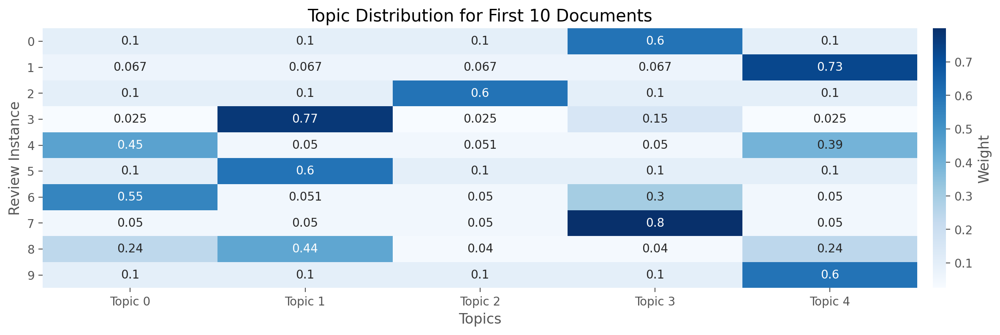

In [58]:
# visualize topic distribution for top-10 instance
plt.figure(figsize=(16, 4), dpi=200)
sns.heatmap(topic_df.iloc[:10], cmap='Blues', annot=True, cbar_kws={'label': 'Weight', 'pad': 0.015})
plt.title('Topic Distribution for First 10 Documents')
plt.ylabel('Review Instance')
plt.xlabel('Topics')
plt.yticks(rotation=0)
plt.show()

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

In [59]:
# Initialize topics with default value (-1 for unclassified)
df4['topic'] = -1
# Loop over each document and assign the most probable topic
for i, doc_bow in enumerate(corpus):
    if doc_bow:  # Only proceed if document is not empty
        topic_distribution = lda_model.get_document_topics(doc_bow)
        # Assign the topic with the highest probability to the 'topic' column
        if topic_distribution:
            df4.at[i, 'topic'] = max(topic_distribution, key=lambda x: x[1])[0]

# Display the updated df4
display(df4.head())

,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,month,year,review_len,tokens,topic
0,Pengguna Google,Mantap,5,0,1.24.1,2024-07-07 16:58:06,7,2024,1,[mantap],3
1,Pengguna Google,Bagus dan mudah digunakan,5,0,1.24.1,2024-07-07 16:57:08,7,2024,4,"[bagus, mudah]",4
2,Pengguna Google,Good,5,0,1.24.1,2024-07-07 16:52:38,7,2024,1,[good],2
3,Pengguna Google,Sangat membantu orang menengah mantap semoga sukses terus gopay,5,0,1.24.1,2024-07-07 16:52:36,7,2024,9,"[membantu, orang, menengah, mantap, semoga, sukses, gopay]",1
4,Pengguna Google,Ga ribet .. Sukaaaa,5,0,1.24.1,2024-07-07 16:52:09,7,2024,4,"[ga, ribet, sukaaaa]",0


In [64]:
# Initialize topic distribution matrix
topic_distribution = np.zeros((len(corpus), lda_model.num_topics))

# Populate the matrix with the topic distribution for each document
for i, doc_bow in enumerate(corpus):
    if doc_bow:  # Only proceed if document is not empty
        for topic_num, prob in lda_model.get_document_topics(doc_bow):
            topic_distribution[i, topic_num] = prob

topic_distribution[:10]

array([[0.10000005, 0.10000005, 0.10000005, 0.59999979, 0.10000005],
       [0.06666675, 0.06666675, 0.06666675, 0.06666675, 0.73333299],
       [0.1000004 , 0.1000004 , 0.59999841, 0.1000004 , 0.1000004 ],
       [0.02533795, 0.77436143, 0.02518056, 0.15004662, 0.02507349],
       [0.45473137, 0.05013504, 0.05054647, 0.05013657, 0.3944506 ],
       [0.10000014, 0.59999943, 0.10000014, 0.10000014, 0.10000014],
       [0.54810113, 0.05061986, 0.05037867, 0.30051368, 0.05038668],
       [0.05000002, 0.05000002, 0.05000002, 0.79999989, 0.05000002],
       [0.23866817, 0.44080585, 0.04005619, 0.04005692, 0.24041289],
       [0.10025928, 0.10026038, 0.10026009, 0.10026358, 0.59895664]])

#### **4.1.4 Visualizing Topic Clusters**

In [66]:
from sklearn.decomposition import PCA
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# # check how many components to retain in pCA
# pca = PCA().fit(topic_distribution)
# explained_variance = np.cumsum(pca.explained_variance_ratio_)
# num_components = np.argmax(explained_variance >= 0.95) + 1  # Number of components for 95% variance
# print(f"Number of components needed to retain 95% variance: {num_components}")

In [67]:
# Apply PCA to retain 95% of the variance
start_time = time.time()
pca = PCA(n_components=0.95)
reduced_data = pca.fit_transform(topic_distribution)
end_time = time.time()
print(f'Time taking for training PCA model: {start_time - end_time:.2f} seconds')

In [70]:
print(f'Number of components selected: {pca.n_components_}')

Number of components selected: 4


t-SNE is computationally expensive and sensitive to noise. Reducing the dimensionality with PCA beforehand helps reduce computation time and improve results.

In [68]:
# Then apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(reduced_data)

- PCA is great for quickly reducing dimensionality and capturing global structure, but it might miss finer local clusters.
- t-SNE excels at showing distinct clusters but is computationally expensive and better for final visualization in 2D or 3D.

pindah ke bagian content analysis saja

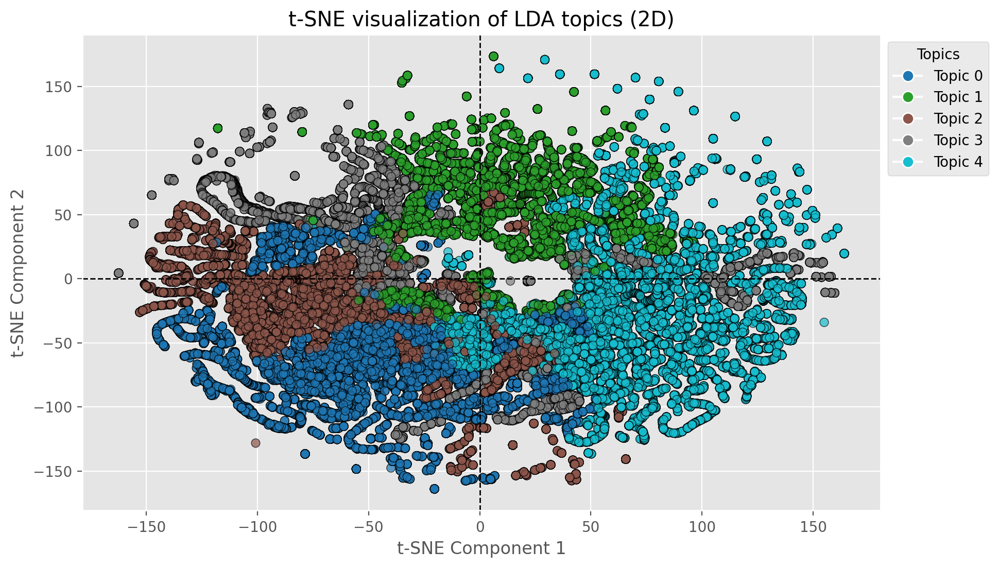

In [81]:
# Filter the topic column to match the reduced data
filtered_topics = df4['topic'].iloc[:len(tsne_results)]
# Get unique topics and sort them
unique_topics = np.sort(filtered_topics.unique())

# Plotting the 2D t-SNE results
plt.figure(figsize=(10, 6), dpi=200)
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=filtered_topics, cmap='tab10', alpha=0.7, edgecolor='k')
plt.axhline(0, color='k', linestyle='--', linewidth=1)
plt.axvline(0, color='k', linestyle='--', linewidth=1)

# Add custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w',
                      markerfacecolor=scatter.cmap(scatter.norm(topic)),
                      markersize=8, label=f'Topic {int(topic)}') for topic in unique_topics]

plt.legend(handles=handles, title="Topics", bbox_to_anchor=(1, 1), loc='upper left')
plt.title('t-SNE visualization of LDA topics (2D)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

plt.show()


The plot clearly shows the formation of distinct clusters, suggesting that the topic model effectively groups documents with similar thematic content.
The clusters are relatively well-separated, indicating that the topics are reasonably distinct from one another.

Some overlap between clusters suggests that there are shared characteristics or similarities among certain topics, which is common in real-world data.
There are a few points that appear to be outliers, located outside the main clusters. These might represent documents that do not fit cleanly into any of the defined topics or might be artifacts of the t-SNE algorithm.

In [85]:


vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(vis)

In [82]:
# Apply t-SNE with 3 components
start_time = time.time()
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_3d_results = tsne_3d.fit_transform(reduced_data)
end_time = time.time()
print(f'Time taking for training PCA model: {start_time - end_time:.2f} seconds')

KeyboardInterrupt: 

In [ ]:
# # Filter the topic column to match the reduced data
# filtered_topics = df4['topic'].iloc[:len(tsne_results)]
# # Get unique topics 
# unique_topics = np.sort(filtered_topics.unique())

# create a 3D plot
fig = plt.figure(figsize=(10, 8), dpi=200)
ax = fig.add_subplot(111, projection='3d')

# Plot 3D t-SNE results
scatter = ax.scatter(tsne_results[:, 0], tsne_results[:, 1], tsne_results[:, 2], 
                     c=filtered_topics, cmap='tab10', alpha=0.7, edgecolor='k')

# add legend
handles = [plt.Line2D([0], [0], marker='o', color='w',
                      markerfacecolor=scatter.cmap(scatter.norm(topic)),
                      markersize=8, label=f'Topic {int(topic)}') for topic in unique_topics]

ax.legend(handles=handles, title="Topics", bbox_to_anchor=(1, 1), loc='upper left')

ax.set_title('3D t-SNE visualization of LDA topics')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
plt.show()

pelajari t-SNE untuk apa dan bagaimana cara kerjanya. Apa bedanya dengan PCA

In [ ]:
# Assuming your LDA model is trained and you have 'corpus' and 'dictionary'
# Prepare the visualization
lda_visualization = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)

# To display it in a Jupyter notebook
pyLDAvis.display(lda_visualization)

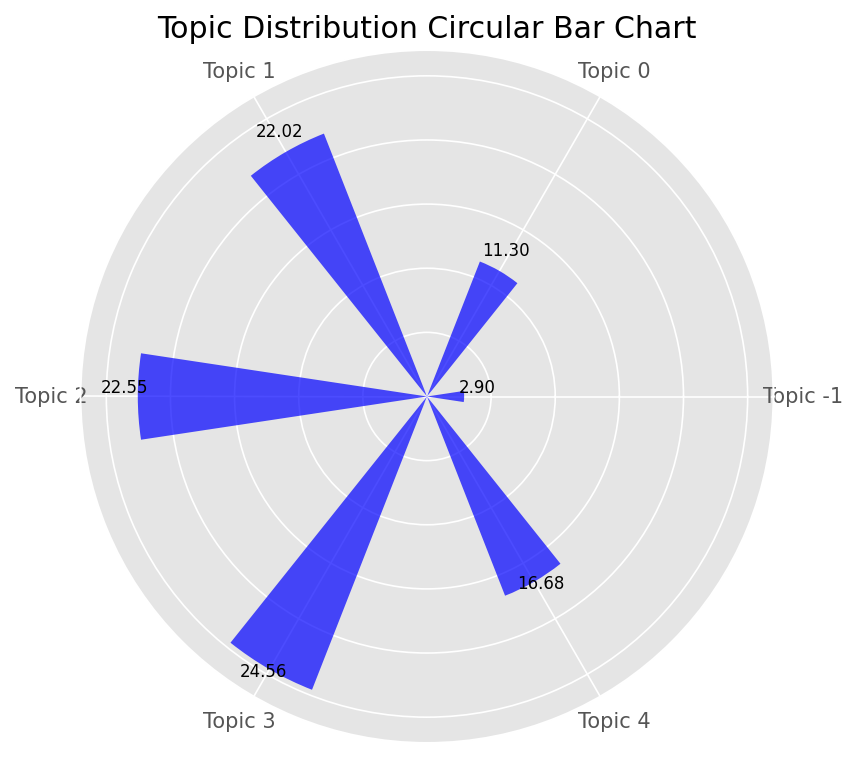

In [ ]:
# Calculate topic distribution as percentages
topic_distribution = (df4['topic'].value_counts(normalize=True) * 100).sort_index()

# Prepare data for circular bar chart
labels = [f'Topic {int(topic)}' for topic in topic_distribution.index]
values = topic_distribution.values
num_vars = len(labels)

# Create an array of angles for each bar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the circle
values = np.concatenate((values, [values[0]]))
angles += angles[:1]

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True), dpi=150)

# Draw bars
bars = ax.bar(angles[:-1], values[:-1], color='b', alpha=0.7, width=0.3)

# Add labels to the bars
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Customize the radial limits
ax.set_ylim(0, max(values) * 1.1)

# Disable y-tick labels while keeping the ticks
ax.set_yticklabels([])  # Set y-tick labels to an empty list

# Add title
plt.title('Topic Distribution Circular Bar Chart')

# Add labels above each bar
label_size = 12  # Adjust this value to change the label size
for i in range(len(values) - 1):
    ax.text(angles[i], values[i] + 1, f'{values[i]:.2f}', ha='center', va='bottom', size=8)

# Show plot
plt.show()

In [ ]:
display((df4['topic'].value_counts(normalize=True)*100).to_frame().round(2).sort_index().transpose())
display((df4['topic'].value_counts()).to_frame().round(2).sort_index().transpose())

topic,-1,0,1,2,3
proportion,2.93,19.44,21.59,30.21,25.83


topic,-1,0,1,2,3
count,3614,23955,26614,37238,31832


In [ ]:
df4[df4['topic']==-1].sample(n=5, random_state=42)

,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,tokens,topic
122923,Ridho Fernando,"Saya sama kek abg fazri tunggu hadir di kota anda katanya .saya tunggu"" tidak juga bisa berbeda dengan dana tidak ada seperti itu . Tpi gopay ini mempersulit yg ingin menggunakan nya ah jadi mls gue dgn gopay ni.aku kasih bintang 1 aj dlu",1,1,1.0.2,2023-05-02 13:20:47,"[kek, abg, fazri, tunggu, hadir, kota, tunggu, berbeda, dana, tpi, gopay, mempersulit, ah, mls, gue, dgn, gopay, ni, kasih, bintang, aj, dlu]",-1
123212,Gibran Iban,Asliii aku mah tim yang beneran exited sama aplikasi ini yah mantap soalnya,5,1,NaN,2023-04-12 12:49:07,"[asliii, mah, tim, beneran, exited, aplikasi, yah, mantap]",-1
121464,Pengguna Google,Apk nya di jamin aman dan fiturnya bagus buat transaksi aman dan tanpa pemotongan,5,1,NaN,2023-06-24 07:44:43,"[apk, jamin, aman, fiturnya, bagus, transaksi, aman, pemotongan]",-1
123213,Rezky bs,Aplikasi jelek tidak berguna habisin kuota aja buat download tidak bisa digunakan,1,4,1.0.0,2023-04-12 12:13:26,"[aplikasi, jelek, berguna, habisin, kuota, download]",-1
122768,Iim Ibrahim,"Alhamdulillah ga lemot app nya, sejauh ini aman pake dan fiturnya lebih lengkap",5,1,NaN,2023-05-08 13:52:58,"[alhamdulillah, ga, lemot, app, aman, pake, fiturnya, lengkap]",-1


In [ ]:
# compute coherence score
coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'],
                                 dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f'Coherence Score: {coherence_score:.4f}')

Coherence Score: 0.5373


The coherence score measures the degree of semantic similarity between high-scoring words in each topic. It ranges from 0 to 1, with higher scores indicating better topic quality. A score of 0.5373 suggests that the topics are moderately coherent. This means that the words in each topic are somewhat related and can collectively convey a clear theme or meaning.

Perplexity is a measure of how well the probability distribution predicted by the model aligns with the observed data. Lower perplexity indicates a better fit to the data.

In [ ]:
# palculate perplexity
perplexity = lda_model.log_perplexity(corpus)

# Convert log perplexity to perplexity
perplexity_value = np.exp(-perplexity)

print(f'Perplexity: {perplexity_value:.4f}')

Perplexity: 1340.5662


### visualizing the topic distributions over time or by user demographics to gain deeper insights

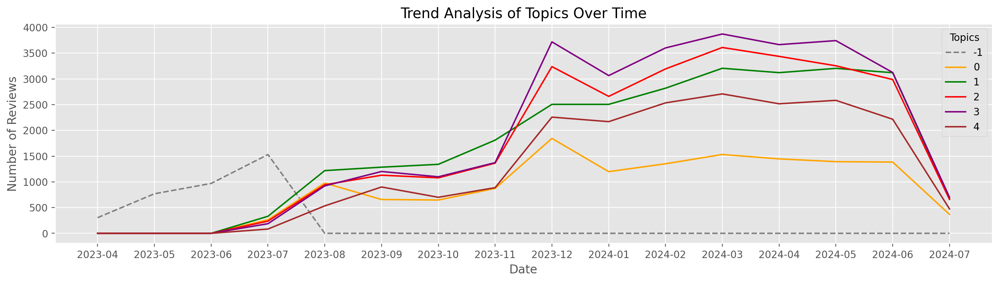

In [ ]:
# prepare data
df4['year_month'] = df4['at'].dt.to_period('M').astype(str)
topic_trends = df4.groupby(['year_month', 'topic']).size().unstack(fill_value=0)

# Plotting the trends
plt.figure(figsize=(17, 4), dpi=200)
custom_palette = ['grey', 'orange', 'green', 'red', 'purple', 'brown']
line_styles = ['--', '-', '-', '-', '-', '-']
for idx, topic in enumerate(topic_trends.columns):
    sns.lineplot(data=topic_trends[topic],
                 color=custom_palette[idx % len(custom_palette)],
                 linestyle=line_styles[idx % len(line_styles)],
                 label=topic)
plt.title('Trend Analysis of Topics Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=0)
plt.legend(title='Topics')
plt.grid(True)
plt.show()

### **4.2 Non-Negative Matrix Factorization**

In [ ]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [ ]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):                                           # Check if the input is a string
        text = text.lower()                                             # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)                                # Remove numbers
        text = re.sub(r'\W+', ' ', text)                                # Remove punctuation
        tokens = text.split()                                           # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]    # Remove stopwords
        return ' '.join(tokens)                                         # Return cleaned text as a single string
    return ''                                                           # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [ ]:
# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

- tf-idf: to highlight most common words in a document but not across entire dataset.

In [ ]:
# Step 2: Grid search for optimal number of topics
topics_range = range(2, 11)  # From 2 to 10 topics
coherence_scores = []
timing_info = []

for num_topics in topics_range:
    # Create and train the NMF model
    start_time = time.time()
    nmf_model = NMF(n_components=num_topics, random_state=42)
    print(f'Training model with {num_topics} topics...')
    nmf_model.fit(tfidf_matrix)

    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)

    # Compute coherence score
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)
    end_time = time.time()
    elapsed_time = end_time - start_time
    timing_info.append(elapsed_time)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}, Time Taken: {elapsed_time:.2f} seconds')

Training model with 2 topics...
Num Topics: 2, Coherence Score: 10.0, Time Taken: 0.80 seconds
Training model with 3 topics...
Num Topics: 3, Coherence Score: 10.0, Time Taken: 0.79 seconds
Training model with 4 topics...
Num Topics: 4, Coherence Score: 10.0, Time Taken: 0.84 seconds
Training model with 5 topics...
Num Topics: 5, Coherence Score: 10.0, Time Taken: 0.96 seconds
Training model with 6 topics...
Num Topics: 6, Coherence Score: 10.0, Time Taken: 1.22 seconds
Training model with 7 topics...
Num Topics: 7, Coherence Score: 10.0, Time Taken: 1.75 seconds
Training model with 8 topics...
Num Topics: 8, Coherence Score: 10.0, Time Taken: 1.99 seconds
Training model with 9 topics...
Num Topics: 9, Coherence Score: 10.0, Time Taken: 1.92 seconds
Training model with 10 topics...
Num Topics: 10, Coherence Score: 10.0, Time Taken: 2.51 seconds


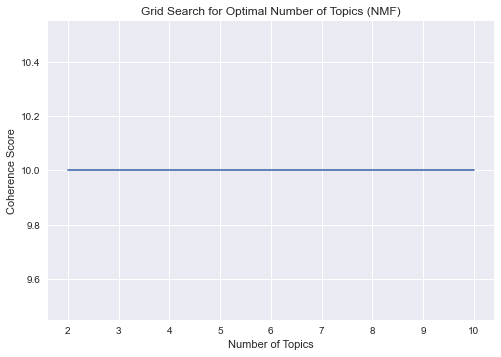

In [ ]:
# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (NMF)')
plt.show()

In [ ]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train NMF model with the optimal number of topics
nmf_model = NMF(n_components=optimal_num_topics, random_state=42)
nmf_model.fit(tfidf_matrix)

Optimal Number of Topics: 2


NMF(n_components=2, random_state=42)

In [ ]:
# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

Topic 0: banget, transaksi, nya, cepat, aplikasi, mudah, membantu, ok, gopay, mantap
Topic 1: cepat, gopay, nya, aplikasinya, ok, mudah, banget, aplikasi, membantu, bagus


In [ ]:
# Assign topics to documents
document_topics = nmf_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score

### **4.3 Latent Semantic Analysis**

In [ ]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [ ]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return ' '.join(tokens)  # Return cleaned text as a single string
    return ''  # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [ ]:
# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

In [ ]:
# Step 2: Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

# Start the grid search with timing
for num_topics in topics_range:
    start_time = time.time()  # Start the timer

    # Create and train the LSA model using Truncated SVD
    svd_model = TruncatedSVD(n_components=num_topics, random_state=42)
    svd_model.fit(tfidf_matrix)

    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(svd_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)

    # Compute coherence score (simplified version)
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)

    # End the timer and calculate elapsed time
    elapsed_time = time.time() - start_time
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}, Time Taken: {elapsed_time:.2f} seconds')


Num Topics: 2, Coherence Score: 10.0, Time Taken: 0.65 seconds
Num Topics: 3, Coherence Score: 10.0, Time Taken: 0.54 seconds
Num Topics: 4, Coherence Score: 10.0, Time Taken: 0.56 seconds
Num Topics: 5, Coherence Score: 10.0, Time Taken: 0.60 seconds
Num Topics: 6, Coherence Score: 10.0, Time Taken: 0.64 seconds
Num Topics: 7, Coherence Score: 10.0, Time Taken: 0.69 seconds
Num Topics: 8, Coherence Score: 10.0, Time Taken: 0.78 seconds
Num Topics: 9, Coherence Score: 10.0, Time Taken: 0.82 seconds
Num Topics: 10, Coherence Score: 10.0, Time Taken: 0.87 seconds
Num Topics: 11, Coherence Score: 10.0, Time Taken: 0.88 seconds
Num Topics: 12, Coherence Score: 10.0, Time Taken: 1.08 seconds
Num Topics: 13, Coherence Score: 10.0, Time Taken: 1.09 seconds
Num Topics: 14, Coherence Score: 10.0, Time Taken: 1.03 seconds
Num Topics: 15, Coherence Score: 10.0, Time Taken: 1.22 seconds
Num Topics: 16, Coherence Score: 10.0, Time Taken: 1.12 seconds
Num Topics: 17, Coherence Score: 10.0, Time Take

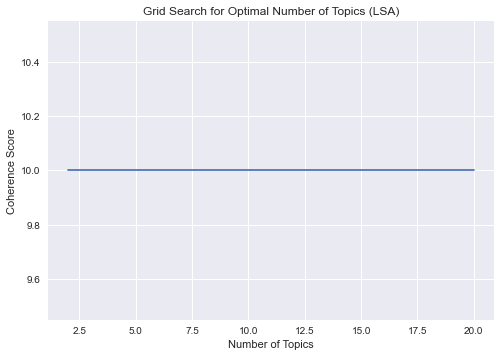

In [ ]:
# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (LSA)')
plt.show()

In [ ]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train LSA model with the optimal number of topics
svd_model = TruncatedSVD(n_components=optimal_num_topics, random_state=42)
svd_model.fit(tfidf_matrix)

Optimal Number of Topics: 2


TruncatedSVD(random_state=42)

In [ ]:
# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(svd_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

Topic 0: nya, banget, cepat, mudah, aplikasi, ok, membantu, gopay, bagus, mantap
Topic 1: cepat, gopay, nya, aplikasinya, ok, mudah, banget, aplikasi, membantu, bagus


In [ ]:
# Assign topics to documents
document_topics = svd_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score

### **4.4 Hierarchical Dirichlet Process**

In [ ]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import HdpModel
import matplotlib.pyplot as plt

In [ ]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [ ]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

In [ ]:
# Create a dictionary and corpus for HDP
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Train HDP model
hdp_model = HdpModel(corpus=corpus, id2word=dictionary)

In [ ]:
# Print the topics
for idx, topic in hdp_model.show_topics(formatted=True):
    print(f"Topic {idx}: {topic}")

Topic 0: 0.038*gopay + 0.022*aplikasi + 0.018*nya + 0.014*transfer + 0.013*mudah + 0.011*bagus + 0.011*transaksi + 0.010*saldo + 0.009*ga + 0.009*banget + 0.009*gak + 0.009*yg + 0.008*membantu + 0.007*aja + 0.007*mantap + 0.007*bank + 0.006*apk + 0.006*cepat + 0.006*masuk + 0.005*pake
Topic 1: 0.025*gopay + 0.012*aplikasi + 0.011*nya + 0.009*ga + 0.008*saldo + 0.008*gak + 0.007*yg + 0.007*bayar + 0.006*bagus + 0.005*aja + 0.005*masuk + 0.005*transaksi + 0.005*udah + 0.004*mantap + 0.004*transfer + 0.004*membantu + 0.004*sy + 0.004*pake + 0.004*mudah + 0.004*limit
Topic 2: 0.012*gopay + 0.007*bagus + 0.007*aplikasi + 0.006*mantap + 0.006*nya + 0.005*mudah + 0.004*membantu + 0.003*transaksi + 0.003*ok + 0.003*transfer + 0.003*ga + 0.003*gak + 0.003*banget + 0.003*saldo + 0.003*yg + 0.002*cepat + 0.002*aja + 0.002*good + 0.002*masuk + 0.002*apk
Topic 3: 0.009*gopay + 0.007*bagus + 0.006*mantap + 0.006*aplikasi + 0.005*membantu + 0.004*mudah + 0.004*nya + 0.003*ok + 0.003*transaksi + 0.003

In [ ]:
import time

# Start timing the assignment of topics
start_time = time.time()

# Assign topics to documents
df4['topic'] = -1  # Initialize with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:  # Only assign a topic if the item is not empty
        topic_info = hdp_model[item]  # Get the topic distribution for the document
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]  # Assign the most probable topic

# End timing and print elapsed time
elapsed_time = time.time() - start_time
print(f'Topic assignment completed in {elapsed_time:.2f} seconds')

# Optionally, you can visualize the results or explore further

Topic assignment completed in 37.43 seconds


In [ ]:
from gensim.models.coherencemodel import CoherenceModel

# Compute coherence score
coherence_model_lda = CoherenceModel(model=lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()

coherence_model_hdp = CoherenceModel(model=hdp_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_hdp = coherence_model_hdp.get_coherence()

coherence_model_nmf = CoherenceModel(topics=document_topics, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_nmf = coherence_model_nmf.get_coherence()

print(f"LDA Coherence Score: {coherence_lda}")
print(f"HDP Coherence Score: {coherence_hdp}")
print(f"NMF Coherence Score: {coherence_nmf}")

ValueError: unable to interpret topic as either a list of tokens or a list of ids

In [ ]:
perplexity_lda = lda_model.log_perplexity(corpus)
print(f"LDA Perplexity: {perplexity_lda}")
# only for LDA

LDA Perplexity: -7.640660203239439


In [ ]:
def topic_diversity(topics, top_n=10):
    unique_words = set()
    total_words = 0
    for topic in topics:
        top_words = [word for word, prob in topic[:top_n]]
        unique_words.update(top_words)
        total_words += len(top_words)
    return len(unique_words) / total_words

# Example for LDA
lda_topics = lda_model.show_topics(formatted=False)
lda_diversity = topic_diversity(lda_topics)

# Example for NMF (assuming you have extracted top words)
# nmf_diversity = topic_diversity(nmf_topics)

print(f"LDA Topic Diversity: {lda_diversity}")
# print(f"NMF Topic Diversity: {nmf_diversity}")

TypeError: cannot unpack non-iterable int object

In [ ]:
# Print LDA topics
for idx, topic in lda_model.print_topics(-1):
    print(f"LDA Topic {idx}: {topic}")

# Print HDP topics (top words)
hdp_topics = hdp_model.show_topics(num_topics=10)
for idx, topic in hdp_topics:
    print(f"HDP Topic {idx}: {topic}")

# Print NMF topics
for idx, topic in enumerate(document_topics):
    print(f"NMF Topic {idx}: {topic}")

LDA Topic 0: 0.087*"transfer" + 0.069*"good" + 0.064*"cepat" + 0.047*"mudah" + 0.047*"gratis" + 0.041*"bank" + 0.033*"transaksi" + 0.032*"biaya" + 0.030*"aman" + 0.028*"admin"
LDA Topic 1: 0.135*"aplikasi" + 0.126*"membantu" + 0.121*"gopay" + 0.032*"yg" + 0.029*"transaksi" + 0.023*"pembayaran" + 0.018*"pakai" + 0.017*"terimakasih" + 0.015*"hadir" + 0.014*"pake"
LDA Topic 2: 0.066*"app" + 0.062*"apk" + 0.057*"simple" + 0.046*"fiturnya" + 0.040*"terbaik" + 0.035*"berguna" + 0.033*"mantab" + 0.033*"promo" + 0.030*"lumayan" + 0.029*"nya"
LDA Topic 3: 0.053*"gopay" + 0.031*"gak" + 0.028*"ga" + 0.026*"nya" + 0.019*"ribet" + 0.018*"udah" + 0.018*"saldo" + 0.018*"aja" + 0.016*"aplikasi" + 0.015*"pake"
LDA Topic 4: 0.200*"bagus" + 0.120*"mudah" + 0.081*"aplikasinya" + 0.066*"aplikasi" + 0.055*"nya" + 0.036*"fitur" + 0.028*"pulsa" + 0.022*"ringan" + 0.020*"praktis" + 0.020*"beli"
LDA Topic 5: 0.070*"semoga" + 0.070*"keren" + 0.056*"kasih" + 0.046*"bintang" + 0.046*"gopay" + 0.044*"oke" + 0.042*"

In [ ]:
from sklearn.metrics import silhouette_score

# Get the topic distribution for each document (using NMF as example)
nmf_topic_matrix = nmf_model.transform(tfidf_matrix)

# Calculate the silhouette score
silhouette_avg = silhouette_score(nmf_topic_matrix, df4['topic'])
print(f"NMF Silhouette Score: {silhouette_avg}")

NMF Silhouette Score: -0.4095115399352652


## **5 Keep First**

### **5.1 Latent Dirichlet Allocation**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

# Create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

for num_topics in topics_range:
    # Create and train the LDA model
    lda_model = LdaModel(corpus=corpus,
                         num_topics=num_topics,
                         id2word=dictionary,
                         passes=15,
                         random_state=42)
    
    # Compute coherence score
    coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}')

# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics')
plt.show()

# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train LDA model with the optimal number of topics
lda_model = LdaModel(corpus=corpus,
                     num_topics=optimal_num_topics,
                     id2word=dictionary,
                     passes=15)

# print the topics
for idx, topic in lda_model.print_topics(-1):
    print(f"Topic {idx}: {topic}")

# assign topics to documents
df4['topic'] = -1       # init with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:            # Only assign a topic if the item is not empty
        topic_info = lda_model.get_document_topics(item)
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]
```

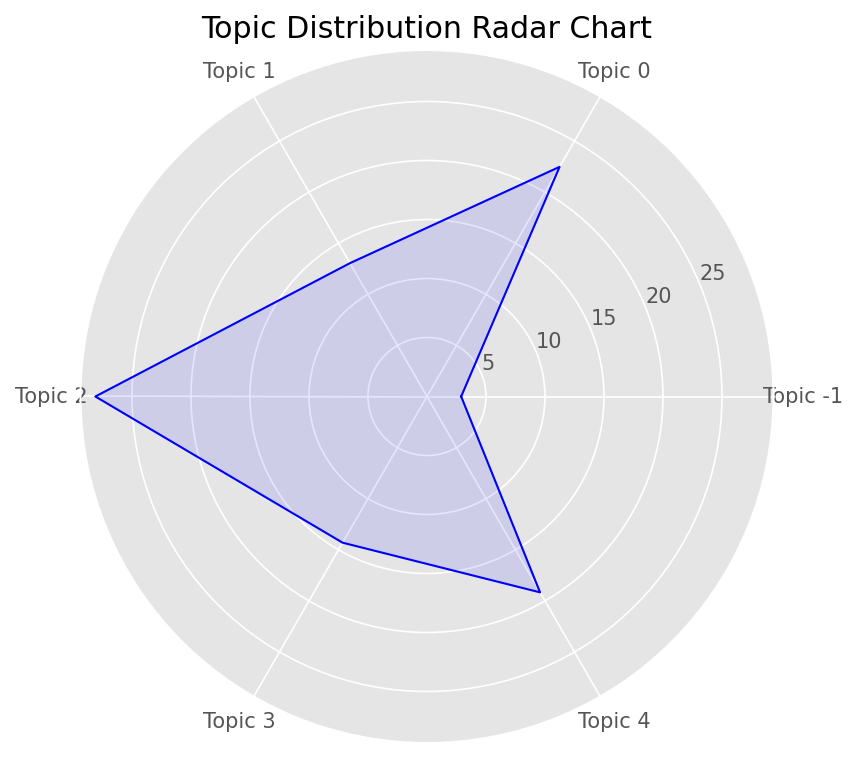

In [ ]:
# Calculate topic distribution as percentages
topic_distribution = (df4['topic'].value_counts(normalize=True) * 100).sort_index()

# Prepare data for radar chart
labels = [f'Topic {int(topic)}' for topic in topic_distribution.index]
values = topic_distribution.values
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Make the plot circular by completing the loop
values = np.concatenate((values, [values[0]]))
angles += angles[:1]

# Plot the radar chart
fig, ax = plt.subplots(figsize=(6, 6), dpi=150, subplot_kw=dict(polar=True))

# Draw one line per topic and fill area
ax.fill(angles, values, color='b', alpha=0.1)
ax.plot(angles, values, color='b', linewidth=1)

# Add labels for each axis
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Set the range for the radar chart
# ax.set_ylim(0, 18)

# Add a title
plt.title('Topic Distribution Radar Chart')

# Show plot
plt.show()

### **5.2 Nonnegative Matrix Factorization**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return ' '.join(tokens)  # Return cleaned text as a single string
    return ''  # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

# Step 2: Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

for num_topics in topics_range:
    # Create and train the NMF model
    nmf_model = NMF(n_components=num_topics, random_state=42)
    nmf_model.fit(tfidf_matrix)
    
    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)
    
    # Compute coherence score (simplified version)
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}')

# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (NMF)')
plt.show()

# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train NMF model with the optimal number of topics
nmf_model = NMF(n_components=optimal_num_topics, random_state=42)
nmf_model.fit(tfidf_matrix)

# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

# Assign topics to documents
document_topics = nmf_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score
```

### **5.3 Hierarchical Dirichlet Process**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import HdpModel
import matplotlib.pyplot as plt

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

# Create a dictionary and corpus for HDP
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Train HDP model
hdp_model = HdpModel(corpus=corpus, id2word=dictionary)

# Print the topics
for idx, topic in hdp_model.show_topics(formatted=True):
    print(f"Topic {idx}: {topic}")

# Assign topics to documents
df4['topic'] = -1  # Initialize with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:  # Only assign a topic if the item is not empty
        topic_info = hdp_model.get_document_topics(item)
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]

# Optionally, you can visualize the results or explore further
```